In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import cosine
from sktime.datasets import load_airline
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
from sktime.transformations.series.detrend import Detrender
from sktime.transformations.series.detrend import Deseasonalizer
from sktime.pipeline import make_pipeline

# Identifying threshold

In [2]:
import os
dir_path = 'time_series/'
len_threshold = 1400

In [2]:
import numpy as np

# Carica i dati
X = np.load('X_finale.npy')
y = np.load('y_finale.npy')
ids = np.load('ids_finale.npy')

# Inizializza le variabili per tenere traccia dei sample per genere
genre_count = {}

# Inizializza le liste per i nuovi dati estratti
X_sampled, y_sampled, ids_sampled = [], [], []

# Numero massimo di sample per genere
max_samples_per_genre = 100

# Loop attraverso i dati per selezionare 100 sample per genere
for i in range(len(X)):
    genre = y[i]
    if genre not in genre_count:
        genre_count[genre] = 0

    # Se non abbiamo ancora selezionato 100 sample per questo genere
    if genre_count[genre] < max_samples_per_genre:
        X_sampled.append(X[i])
        y_sampled.append(y[i])
        ids_sampled.append(ids[i])
        genre_count[genre] += 1

    # Se abbiamo già selezionato 100 sample per questo genere, passiamo al prossimo
    else:
        continue

# Converti le liste in numpy arrays
X_sampled = np.array(X_sampled)
y_sampled = np.array(y_sampled)
ids_sampled = np.array(ids_sampled)

# Ora X_sampled contiene 100 sample per genere


In [4]:
#X=X_sampled
#y=y_sampled
#ids=ids_sampled

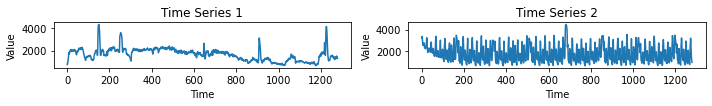

In [3]:
# Plot the first 10 time series
plt.figure(figsize=(10, 6))
for i in range(2):
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns, i+1 is the plot index
    plt.plot(X[i][0])  # Assuming X is a list of lists where each inner list contains a single time series
    plt.title(f"Time Series {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Value")
plt.tight_layout()
plt.show()

In [6]:
X


array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[2744.44416673, 2714.7230879 , 2696.45324601, ...,
         3747.16287653, 3684.38455206, 3837.18621856]],

       [[1679.19150849, 1371.38211376, 1276.83064524, ...,
         1590.93902708, 1215.85383607, 1044.4196475 ]],

       [[1760.40333559, 1669.68354612, 1690.64028044, ...,
         2342.71927807, 3021.21525668, 3253.65964701]]])

### We can note no info after 1200...so we set 1280 as treshold

In [7]:
len_threshold = 1280   #cause >1280 no infos in ts 

# Loading TS

In [3]:
# Ottieni i valori unici e le loro frequenze
valori_unici, conteggi = np.unique(y_sampled, return_counts=True)

# Stampare il numero di volte che ogni classe appare
for classe, conteggio in zip(valori_unici, conteggi):
    print(f"{classe}: {conteggio}")

emo: 100
folk: 100
goth: 100
happy: 100
heavy-metal: 100
honky-tonk: 100
j-idol: 100
kids: 100
minimal-techno: 100
mpb: 100
new-age: 100
opera: 100
piano: 100
progressive-house: 100
salsa: 100
sertanejo: 100
sleep: 100
songwriter: 100
synth-pop: 100
world-music: 100


In [76]:
X_sampled

array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[2744.44416673, 2714.7230879 , 2696.45324601, ...,
         3747.16287653, 3684.38455206, 3837.18621856]],

       [[1679.19150849, 1371.38211376, 1276.83064524, ...,
         1590.93902708, 1215.85383607, 1044.4196475 ]],

       [[1760.40333559, 1669.68354612, 1690.64028044, ...,
         2342.71927807, 3021.21525668, 3253.65964701]]])

In [10]:
X

array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[2744.44416673, 2714.7230879 , 2696.45324601, ...,
         3747.16287653, 3684.38455206, 3837.18621856]],

       [[1679.19150849, 1371.38211376, 1276.83064524, ...,
         1590.93902708, 1215.85383607, 1044.4196475 ]],

       [[1760.40333559, 1669.68354612, 1690.64028044, ...,
         2342.71927807, 3021.21525668, 3253.65964701]]])

In [4]:
len(y_sampled)

2000

In [5]:
y_sampled

array(['opera', 'minimal-techno', 'goth', ..., 'salsa', 'salsa',
       'songwriter'], dtype='<U17')

In [6]:
len(ids_sampled)

2000

In [7]:
import numpy as np

# Conta il numero di generi unici presenti nella lista y
unique_genres = np.unique(y_sampled)
num_unique_genres = len(unique_genres)

print("Numero di generi unici:", num_unique_genres)
print('generi unici:', unique_genres)


Numero di generi unici: 20
generi unici: ['emo' 'folk' 'goth' 'happy' 'heavy-metal' 'honky-tonk' 'j-idol' 'kids'
 'minimal-techno' 'mpb' 'new-age' 'opera' 'piano' 'progressive-house'
 'salsa' 'sertanejo' 'sleep' 'songwriter' 'synth-pop' 'world-music']


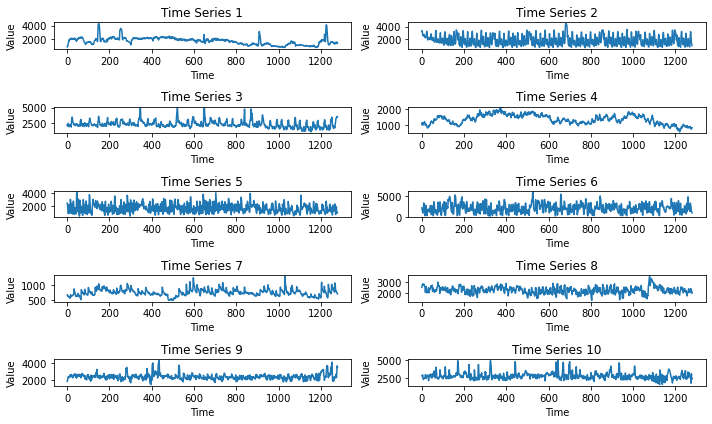

In [15]:
# Plot the first 10 time series
plt.figure(figsize=(10, 6))
for i in range(10):
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns, i+1 is the plot index
    plt.plot(X_sampled[i][0])  # Assuming X is a list of lists where each inner list contains a single time series
    plt.title(f"Time Series {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Value")
plt.tight_layout()
plt.show()

# Trasformazioni (amplitude scaling, noise)  win size= 100

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

# Define window size for rolling mean
w = 150


In [8]:
from sktime.transformations.series.paa import PAA

# Reconstruct Error on PAA approx

In [18]:
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

# Define your time series data in X

# Define window size for rolling mean
w_values = [5, 10, 100, 150, 180, 250]

original_series_list = []
scaled_series_list = []
smoothed_series_list = []
euclidean_distance_list = []

min_distance = float('inf')  # Initialize min_distance with infinity
best_w = None

for w in w_values:
    scaled_series_per_w = []  # List to store scaled series for the current window size
    smoothed_series_per_w = []  # List to store smoothed series for the current window size
    original_series_per_w = []  # List to store reconstructed series for the current window size
    
    distance_sum = 0
    for i in range(len(X_sampled)):
        ts = X_sampled[i][0]  # Assuming X is a list of time series
        
        # Scale the time series
        scaler = StandardScaler()
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))
        
        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())
        
        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()
            
        # Capture noise (difference between scaled and smoothed series)
        noise = ts_scaled.squeeze() - ts_smoothed
        
        # Reconstruct the original time series by adding back the noise
        original_series = ts_smoothed + noise

        # Append the current time series to the lists for the current window size
        scaled_series_per_w.append(ts_scaled)
        smoothed_series_per_w.append(ts_smoothed)
        original_series_per_w.append(original_series)

        
        # Calculate Euclidean distance between original and smoothed time series
        distance = pairwise_distances(ts_scaled.flatten().reshape(1, -1), np.array(original_series).flatten().reshape(1, -1), metric='euclidean')
        distance_sum += distance

    # Calculate average Euclidean distance for the current window size
    avg_distance = distance_sum / len(X_sampled)
    euclidean_distance_list.append(avg_distance)
    
    # Update min_distance and best_w if the current average distance is smaller than min_distance
    if avg_distance < min_distance:
        min_distance = avg_distance
        best_w = w
        
    # Append the lists for the current window size to the main lists
    scaled_series_list.append(scaled_series_per_w)
    smoothed_series_list.append(smoothed_series_per_w)
    original_series_list.append(original_series_per_w)

# Print best window size and corresponding minimum Euclidean distance
print("Best window size:", best_w)
print("Minimum Euclidean distance:", min_distance)


Best window size: 10
Minimum Euclidean distance: [[4.48025198e-07]]


In [19]:
scaled = np.array(smoothed_series_per_w)

In [20]:
len(scaled)

4000

In [21]:
# Find the index of the best window size in w_values
best_w_index = w_values.index(best_w)

w = 150

# Select the lists corresponding to the best window size
best_scaled_series_list = scaled_series_list[best_w_index]
best_smoothed_series_list = smoothed_series_list[best_w_index]
best_original_series_list = original_series_list[best_w_index]

# Now you can use best_scaled_series_list, best_smoothed_series_list, and best_original_series_list
# for further analysis or visualization

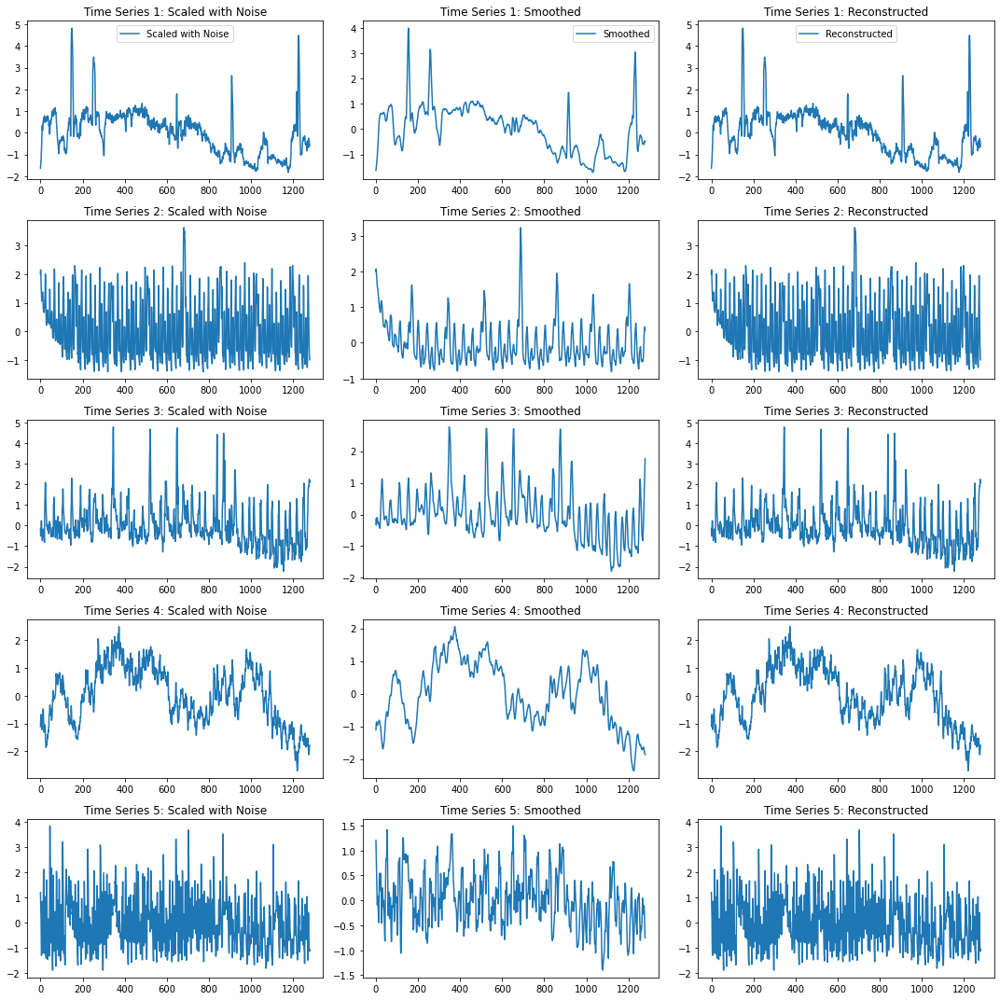

In [22]:
# Plot the scaled time series with noise and the reconstructed time series side by side
num_series_to_plot = (5)  # Plot at most 50 time series or the number available
num_plots = 3  # Three plots per time series: scaled with noise, smoothed, and reconstructed

if num_series_to_plot > 0:
    plt.figure(figsize=(15, num_series_to_plot*3))

    for i in range(num_series_to_plot):
        for j in range(num_plots):
            plt.subplot(num_series_to_plot, num_plots, i * num_plots + j + 1)
            if j == 0:
                plt.plot(best_scaled_series_list[i], label='Scaled with Noise')
                plt.title(f'Time Series {i+1}: Scaled with Noise')
            elif j == 1:
                plt.plot(best_smoothed_series_list[i], label='Smoothed')
                plt.title(f'Time Series {i+1}: Smoothed')
            else:
                plt.plot(best_original_series_list[i], label='Reconstructed')
                plt.title(f'Time Series {i+1}: Reconstructed')
            if i == 0:
                plt.legend()

    plt.tight_layout()
    plt.show()
else:
    print("No time series available for plotting.")


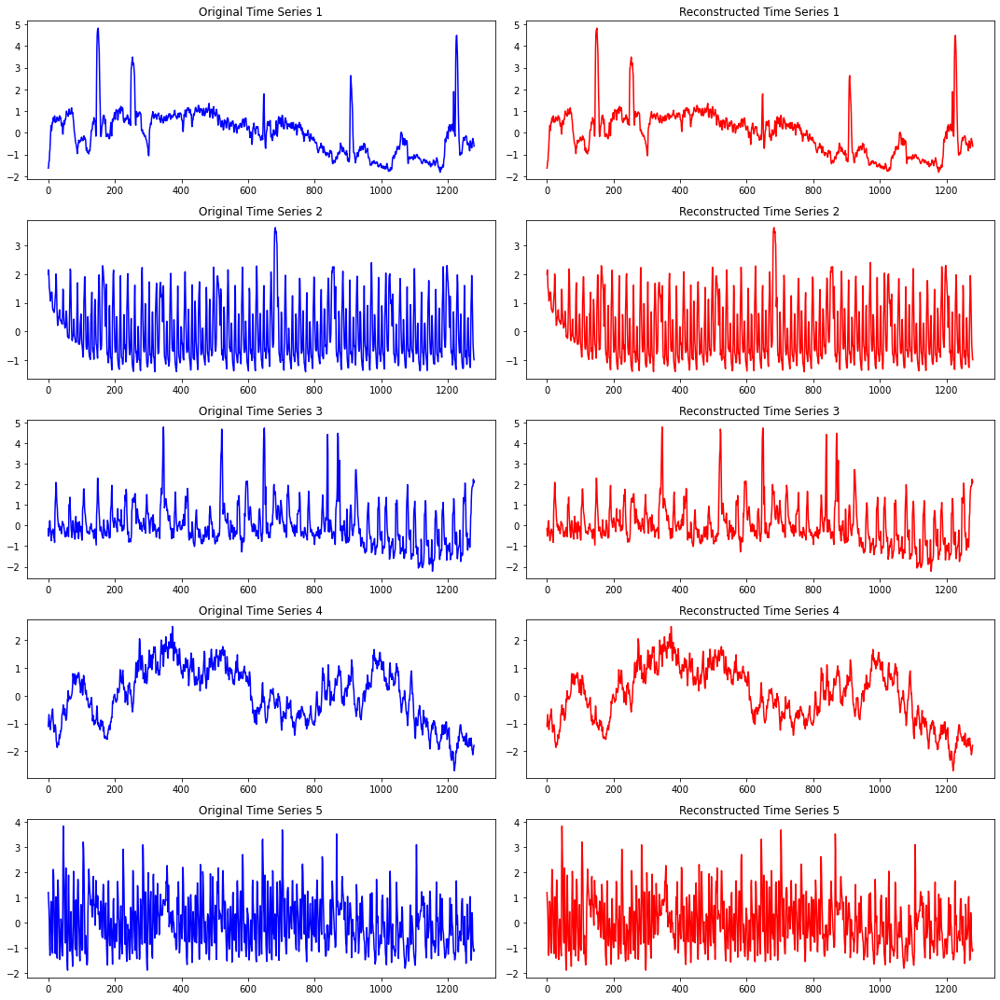

In [23]:
import matplotlib.pyplot as plt

# Assuming original_series_list contains the reconstructed original time series
# and X contains the original time series data

# Plotting the time series side by side
num_samples = 5  # Number of time series to plot

fig, axs = plt.subplots(num_samples, 2, figsize=(15, num_samples*3))

for i in range(num_samples):
    # Original time series
    axs[i, 0].plot(best_scaled_series_list[i], color='blue', label='Original')
    axs[i, 0].set_title('Original Time Series ' + str(i+1))
    
    # Reconstructed time series
    axs[i, 1].plot(best_original_series_list[i], color='red', label='Reconstructed')
    axs[i, 1].set_title('Reconstructed Time Series ' + str(i+1))

plt.tight_layout()
plt.show()


# Find best PAA intervals

The best interval value is: 160
Minimum euclidean distance: 1.057730422074065


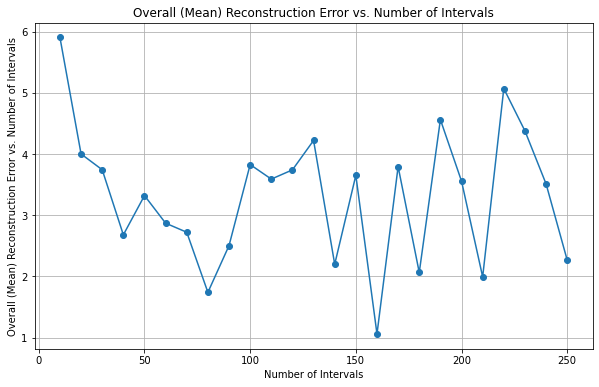

In [12]:
from tslearn.piecewise import PiecewiseAggregateApproximation
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import euclidean

# Define a function to calculate Euclidean distance
def calculate_euclidean_distance(x1, x2):
    return np.sqrt(np.sum((x1 - x2) ** 2))

# Initialize a list to store average distances for different values of num_intervals
avg_distances = []

# Initialize a list to store the distances for the best interval
distances_for_best_interval = []

# Iterate over each time series in X
for series_list in X_sampled:

    # Initialize a list to store average distances for different values of num_intervals for the current series
    avg_distances_series = []

    # Try different values of num_intervals
    for num_intervals in range(10, 251, 10):  # Try intervals from 10 to 250

        # Select the first time series
        ts = series_list[0]  # Assuming each series_list contains a single time series

        # Scale the time series
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())

        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

        # New dataframe for ts_smoothed
        df = pd.DataFrame(ts_smoothed)
        df_values = df.values.reshape(1, -1, 1)  # Reshape to 3D array (n_samples, n_timestamps, n_features)

        # Perform Piecewise Aggregate Approximation (PAA)
        paa = PiecewiseAggregateApproximation(n_segments=num_intervals)
        ts_paa = paa.fit_transform(df_values)

        # Invert PAA transformation
        inverse_paa = paa.inverse_transform(ts_paa)

        # Invert scaling transformation
        reconstructed_series = inverse_paa.squeeze()

        # Calculate Euclidean distance between smoothed and reconstructed time series
        distance = calculate_euclidean_distance(ts_smoothed, reconstructed_series)

        # Append the distance to the list
        avg_distances_series.append(distance)

    # Append the average distances for the current series to the overall list
    avg_distances.append(avg_distances_series)

# Calculate the overall average distances across all time series for each num_intervals
overall_avg_distances = np.mean(avg_distances, axis=0)

# Find the index of the minimum overall average Euclidean distance
best_interval_index = np.argmin(overall_avg_distances)

# Calculate the corresponding best num_intervals
best_interval = 10 + best_interval_index * 10  # Because the intervals start from 10 and increase by 10

# Obtain the minimum Euclidean distance
min_euclidean_distance = overall_avg_distances[best_interval_index]

# Print the best interval value and the corresponding minimum Euclidean distance
print("The best interval value is:", best_interval)
print("Minimum euclidean distance:", min_euclidean_distance)

# Plot the overall average distances for different values of num_intervals
plt.figure(figsize=(10, 6))
plt.plot(range(10, 251, 10), overall_avg_distances, marker='o', linestyle='-')
plt.title('Overall (Mean) Reconstruction Error vs. Number of Intervals')
plt.xlabel('Number of Intervals')
plt.ylabel('Overall (Mean) Reconstruction Error vs. Number of Intervals')
plt.grid(True)
plt.show()


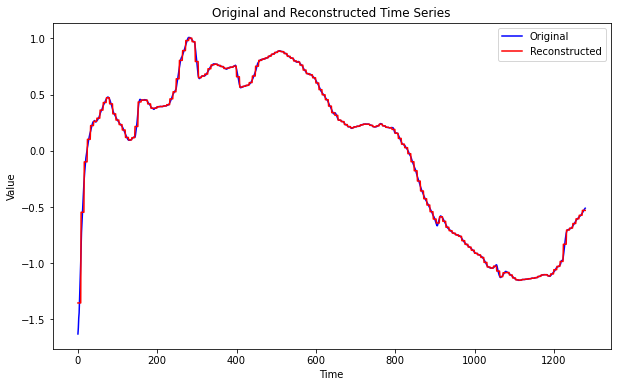

In [14]:
# Define window size for rolling mean
w = 150  # Best value from previous studies

# best value from previous studies
num_intervals = 160

# Select one time series from X
ts = X_sampled[0][0]  # Assuming X is a list of lists where each inner list contains a single time series

# Initialize scaler
scaler = StandardScaler()

# Scale the time series
tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

# Mean centering and standardization (amplitude scaling)
ts_scaled = ((tss - tss.mean()) / tss.std())

# Apply rolling window mean (noise)
ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

# New dataframe for ts_smoothed
df = pd.DataFrame(ts_smoothed)
df_values = df.values.reshape(1, -1, 1)  # Reshape to 3D array (n_samples, n_timestamps, n_features)

# Perform Piecewise Aggregate Approximation (PAA)
paa = PiecewiseAggregateApproximation(n_segments=num_intervals)
ts_paa = paa.fit_transform(df_values)

# Invert PAA transformation
inverse_paa = paa.inverse_transform(ts_paa)

# Invert scaling transformation
reconstructed_series = inverse_paa.squeeze()

# Plot original and reconstructed time series
plt.figure(figsize=(10, 6))
plt.plot(ts_smoothed, label='Original', color='blue')
plt.plot(reconstructed_series, label='Reconstructed', color='red')
plt.title('Original and Reconstructed Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


# Preprocess TS with best values so far

In [9]:
w=150 
best_intervals=160 # from past studies
ts_paa_list = []

for i in range(len(X_sampled)):
        ts = X_sampled[i][0]  # Assuming X is a list of lists where each inner list contains a single time series

        # Scale the time series
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())

        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

        # Perform Piecewise Aggregate Approximation (PAA)
        paa = PAA(frames=best_intervals)
        ts_paa = paa.fit_transform(pd.DataFrame(ts_smoothed)).iloc[:, 0].values
        ts_paa_list.append([ts_paa])

In [10]:
ts_paa

array([-1.90984771e+00, -1.35121918e+00, -1.06456067e+00, -1.11018522e+00,
       -3.94244728e-01,  2.32484812e-01,  1.77569741e-01,  1.90716008e-02,
       -4.99760653e-02, -3.56589968e-02,  1.26080739e-01,  9.40462844e-02,
        4.30409100e-02, -1.61580566e-02, -1.20963045e-02,  4.34967154e-02,
        1.92321695e-01,  1.76859916e-01,  1.41035914e-01,  1.95675828e-01,
        1.99052866e-01,  2.28187674e-01,  3.03157291e-01,  1.37000824e-01,
        6.95775655e-02,  1.50897966e-01,  2.51903152e-01,  2.41605178e-01,
        1.67674203e-01,  6.11092346e-02,  2.16633206e-02,  1.09668358e-02,
        3.56314238e-02, -1.62581579e-02, -8.64790669e-02, -1.44233790e-01,
       -5.47713937e-02,  2.65113114e-02,  5.73249012e-02,  1.36928188e-01,
        9.87563490e-02,  2.12965952e-02, -3.69479929e-02, -1.14485445e-01,
       -1.64001972e-01, -1.20841601e-01, -6.51966338e-02, -5.10525485e-02,
        1.22651797e-02,  8.57678265e-02,  1.23705806e-01,  1.60371467e-01,
        2.02493717e-01,  

In [11]:
ts_paa_vect = np.array(ts_paa_list)

In [12]:
ts_paa_vect.shape

(2000, 1, 160)

In [30]:
# salva serie temporali normalizzate
#salvo i valori ottenuti
import numpy as np
import pandas as pd

# Assume che X, y e ids siano già definiti

# Salva i numpy array separatamente
np.save('X_finale_normalizzato_100.npy', ts_paa_vect)
np.save('y_finale_normalizzato_100.npy', y_sampled)
np.save('ids_finale_normalizzato_100.npy', ids_sampled)



## Motifs

In [31]:
# salva serie temporali normalizzate
#salvo i valori ottenuti
import numpy as np
import pandas as pd

# Assume che X, y e ids siano già definiti

# Salva i numpy array separatamente
ts_paa_vect=np.load('X_finale_normalizzato_100.npy')
y_sampled=np.load('y_finale_normalizzato_100.npy')
ids_sampled=np.load('ids_finale_normalizzato_100.npy')



In [32]:
y_sampled

array(['opera', 'minimal-techno', 'goth', ..., 'songwriter', 'songwriter',
       'songwriter'], dtype='<U17')

In [33]:
ts_paa_vect.shape

(4000, 1, 160)

In [34]:
!pip install matrixProfile

In [35]:
import matrixProfile

ModuleNotFoundError: No module named 'matrixProfile'

In [ ]:
# estrai gli indici
motifs_list = []

for i in range(ts_paa_vect.shape[0]):
    # Seleziona la serie temporale corrente
    ts_values = ts_paa_vect[i, 0, :]
    
    # Calcola la larghezza della finestra
    w = 5
    # Verifica se la lunghezza della serie temporale è sufficiente per calcolare la Matrix Profile
    #if len(ts_values) >= w:
        # Calcola la Matrix Profile per la serie temporale corrente
    mp, mpi = matrixProfile.stomp(ts_values, w)
        
        # Estrai i motifs dalla Matrix Profile
    mo, mod = motifs.motifs(ts_values, (mp, mpi), max_motifs=3)  # Estrarre i primi 3 motifs
        
        # Aggiungi gli indici alla lista
    motifs_list.append(mo)

# Ora motifs_list contiene i motifs per ogni serie temporale che ha una lunghezza sufficiente per calcolare la Matrix Profile


NameError: name 'matrixProfile' is not defined

In [ ]:
len(motifs_list)

2000

In [ ]:
motifs_list

[[[107, 120], [98, 102, 125]],
 [[78, 121], [114, 126]],
 [[31, 73, 85], [136, 140], [92, 122, 143]],
 [[84, 143], [5, 35, 104], [76, 147]],
 [[81, 103], [96, 111]],
 [[69, 73, 144], [41, 54]],
 [[16, 71, 77], [55, 60]],
 [[27, 91, 154], [47, 80, 135]],
 [[27, 77, 132], [23, 68], [102, 143]],
 [[45, 97], [62, 67, 76]],
 [[6, 48], [83, 97], [56, 66]],
 [[59, 103], [36, 69], [79, 148]],
 [[92, 96], [134, 139], [64, 128]],
 [[14, 79, 125], [89, 98], [65, 137]],
 [[12, 16, 142], [64, 80], [25, 37]],
 [[79, 82], [15, 60, 110], [96, 150]],
 [[20, 73], [15, 115]],
 [[114, 129], [22, 59], [15, 42]],
 [[47, 70], [86, 155], [42, 145]],
 [[19, 57], [138, 150]],
 [[10, 115], [65, 135], [29, 41]],
 [[11, 127], [55, 142, 150]],
 [[0, 37], [40, 53, 123]],
 [[120, 153]],
 [[7, 87], [124, 128], [35, 90, 144]],
 [[71, 94], [28, 147], [44, 51]],
 [[42, 138], [6, 11, 92], [86, 153]],
 [[128, 145], [7, 59, 131], [50, 104]],
 [[61, 135], [86, 89, 116], [120, 155]],
 [[149, 152], [106, 112], [72, 134]],
 [[5

In [ ]:
import numpy as np

# Lista per salvare le sotto-sequenze dei motifs
motif = []

# Numero massimo di motifs da estrarre per ogni serie temporale
max_motifs_per_timeseries = 3

for motifs_indices in motifs_list:
    motif_sequence = []  # Inizializza una nuova sequenza di motif
    # Estrai fino ai primi 3 motifs di ogni serie temporale
    for motif_indices in motifs_indices[:max_motifs_per_timeseries]:
        motif_subsequence = []  # Inizializza una nuova sotto-sequenza di motif per ogni indice di motif
        for index in motif_indices:
            motif_subsequence.append(ts_values[index:index + w])  # Estrai la sotto-sequenza per ogni indice di motif
        # Aggiungi la sotto-sequenza di motif alla sequenza di motif
        motif_sequence.extend(motif_subsequence)
    
    # Aggiungi zeri per i motifs mancanti se la serie temporale non contiene 3 motifs
    while len(motif_sequence) < max_motifs_per_timeseries * w:
        motif_sequence.append(np.zeros(w))  # Aggiungi una sequenza vuota di lunghezza w
    
    # Riduci la lunghezza della sequenza di motif a 3 se contiene più di 3 motifs
    motif_sequence = motif_sequence[:max_motifs_per_timeseries]
    
    # Aggiungi la sequenza di motif alla lista di motif
    motif.append(motif_sequence)

# Trasforma la lista di motifs in un array numpy
motif_array = np.array(motif)


In [ ]:
len(motif_array )

2000

In [ ]:
motif_array

array([[[-0.03890035, -0.02828076, -0.06862795, -0.12168464,
         -0.08872918],
        [ 0.01099608,  0.04065978,  0.02311226, -0.03355336,
         -0.01463906],
        [-0.04483924, -0.03251452, -0.06937346, -0.0514772 ,
         -0.05464263]],

       [[-0.10017519, -0.01576149,  0.01125294,  0.05084019,
          0.04829519],
        [ 0.04065978,  0.02311226, -0.03355336, -0.01463906,
          0.00717121],
        [-0.0619147 , -0.0403467 ,  0.00465438, -0.00907032,
          0.00536317]],

       [[ 0.01096684,  0.03563142, -0.01625816, -0.08647907,
         -0.14423379],
        [-0.33384571, -0.30267754, -0.25588455, -0.18861571,
         -0.15021012],
        [ 0.00108873,  0.04200589,  0.01792311,  0.03403233,
          0.01612536]],

       ...,

       [[-0.04997607, -0.035659  ,  0.12608074,  0.09404628,
          0.04304091],
        [ 0.19905287,  0.22818767,  0.30315729,  0.13700082,
          0.06957757],
        [ 0.06957757,  0.15089797,  0.25190315,  0.241605

In [ ]:
# Lista per salvare i primi elementi di ogni motivo interno
first_elements = []

# Itera su ogni sottolista di motif_array
for sub_list in motif_array:
    # Lista per salvare i primi elementi di ogni motivo interno per la sottolista corrente
    sub_first_elements = []
    
    # Itera su ogni motivo interno nella sottolista corrente
    for motif_internal in sub_list:
        # Aggiungi il primo elemento del motivo interno alla lista
        sub_first_elements.append(motif_internal[0])
    
    # Aggiungi la lista dei primi elementi dei motivi interni alla lista principale
    first_elements.append(sub_first_elements)

In [ ]:
# Stampa l'array risultante
len(first_elements)

2000

In [ ]:
motif_array[0]

array([[-0.03890035, -0.02828076, -0.06862795, -0.12168464, -0.08872918],
       [ 0.01099608,  0.04065978,  0.02311226, -0.03355336, -0.01463906],
       [-0.04483924, -0.03251452, -0.06937346, -0.0514772 , -0.05464263]])

In [ ]:
first_elements[0]

[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696]

## Grafico

In [ ]:
# Inizializza una lista vuota per memorizzare le serie temporali estratte
ts_values_list = []

# Estrai le serie temporali dalla matrice time_series_data e aggiungile a ts_values_list
for ts_values in ts_paa_vect:
    ts_values_list.append(ts_values)


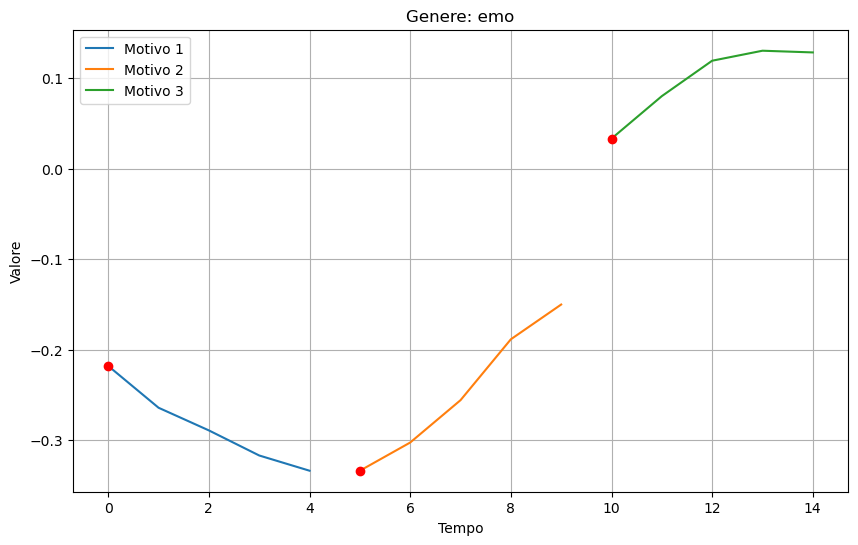

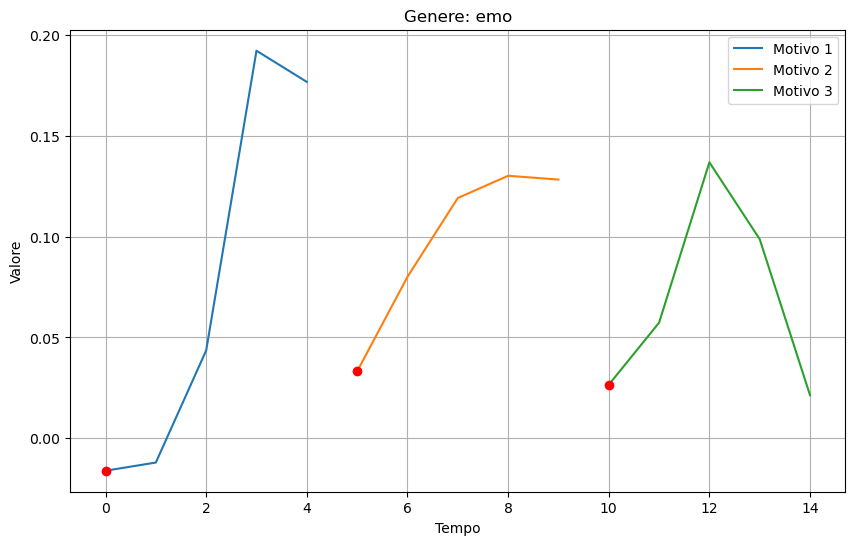

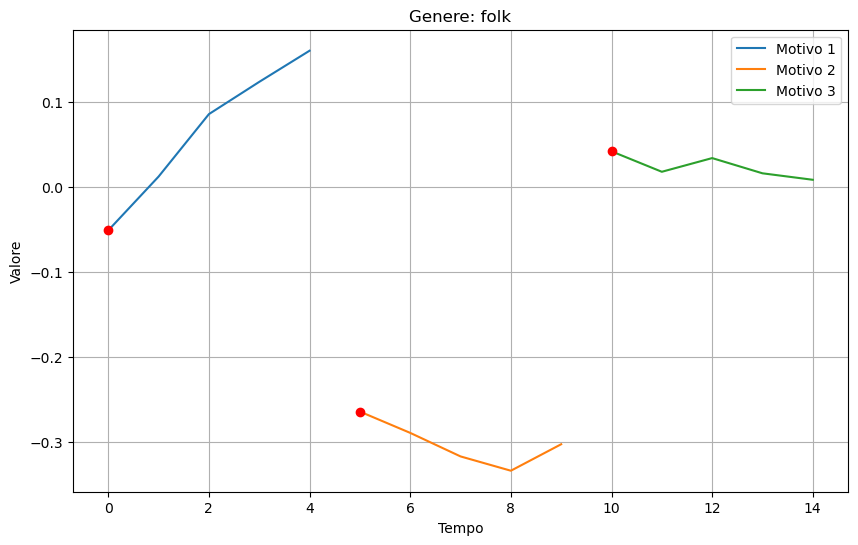

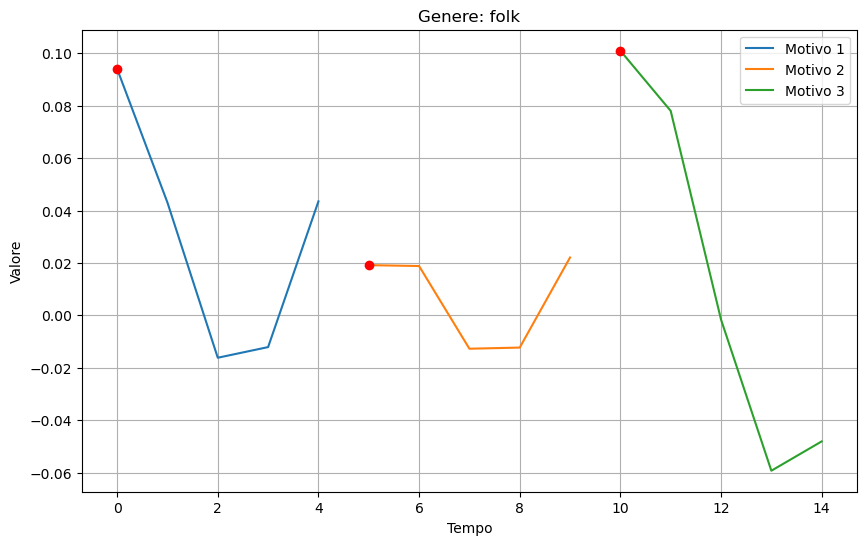

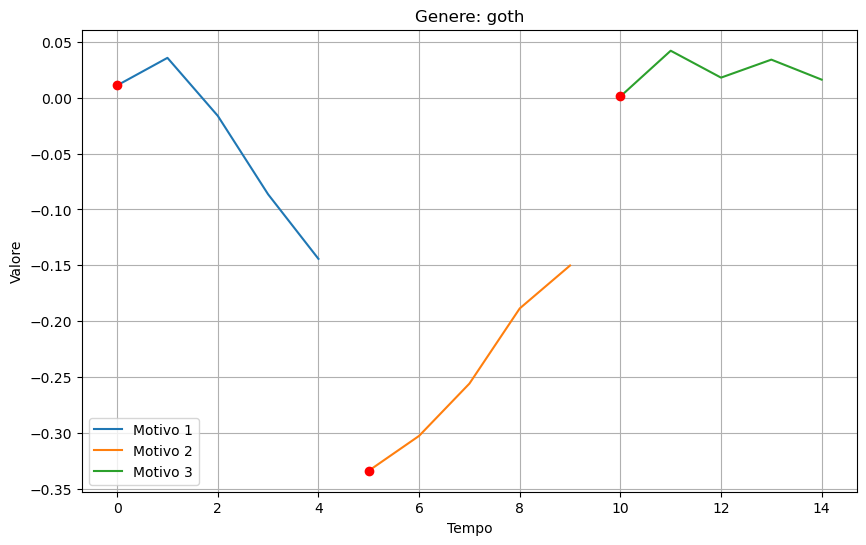

...

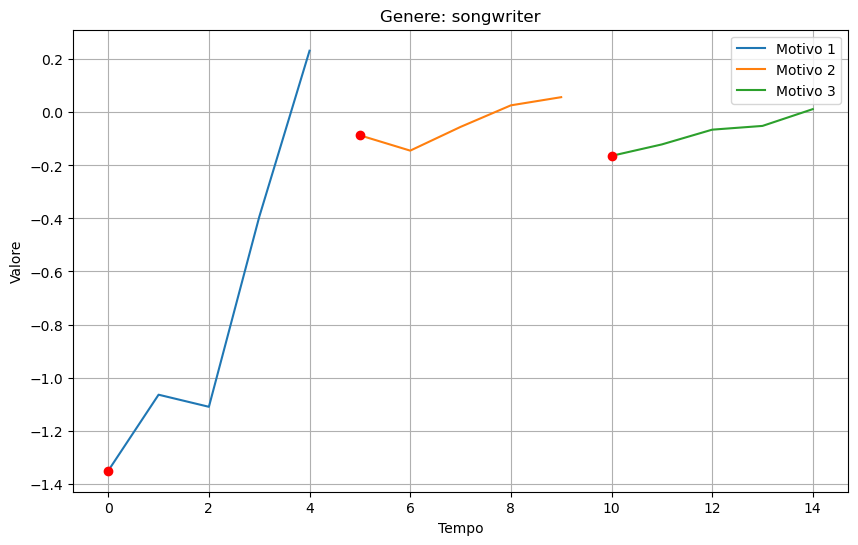

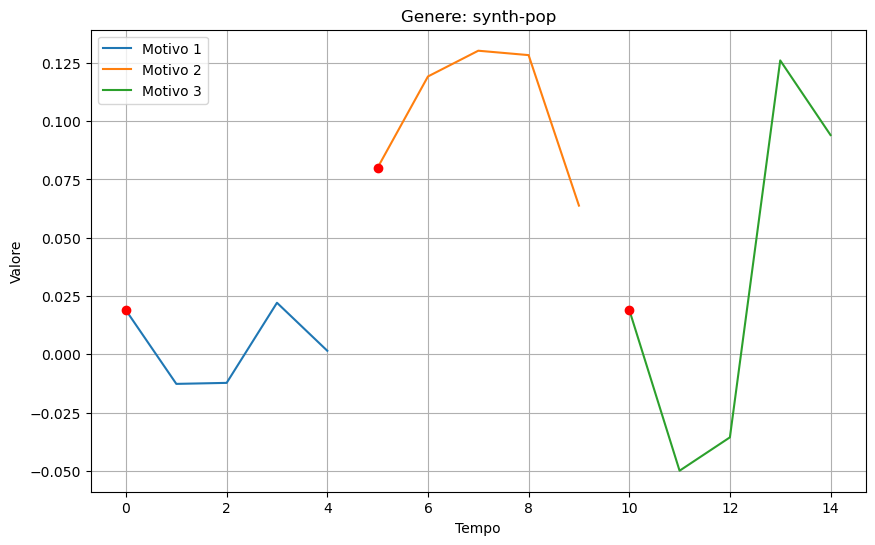

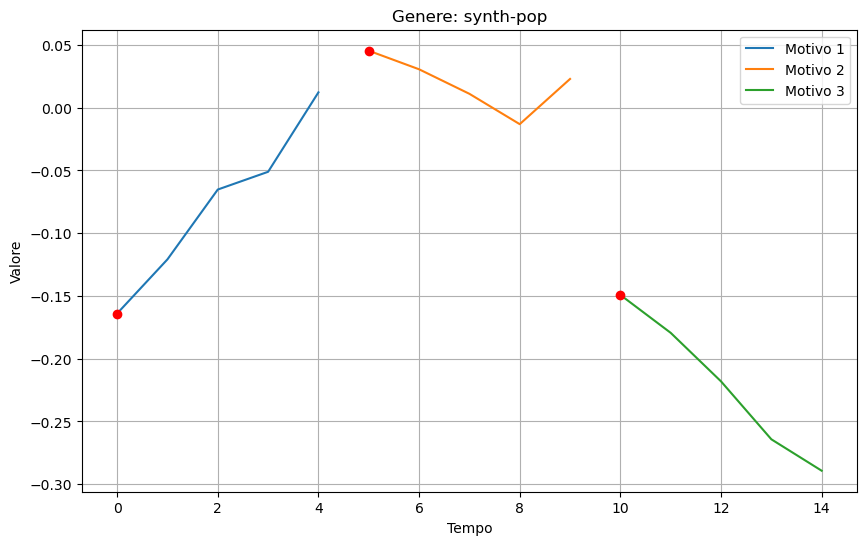

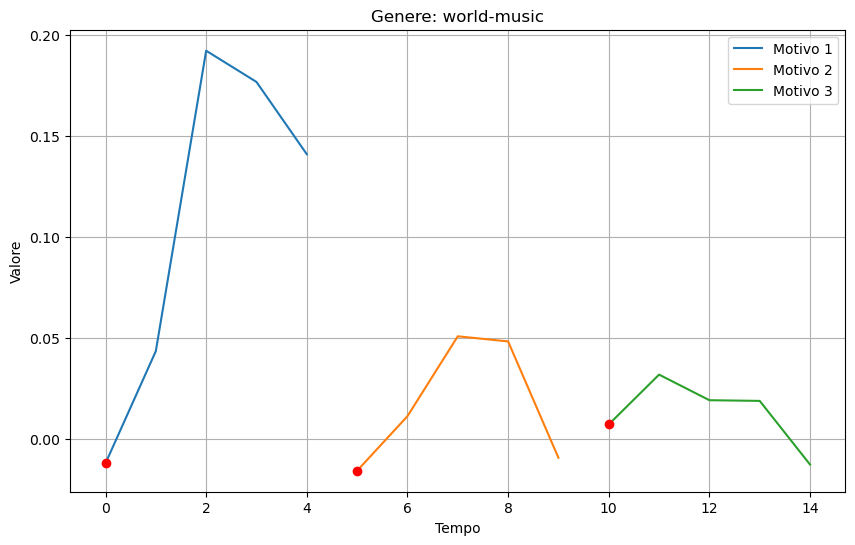

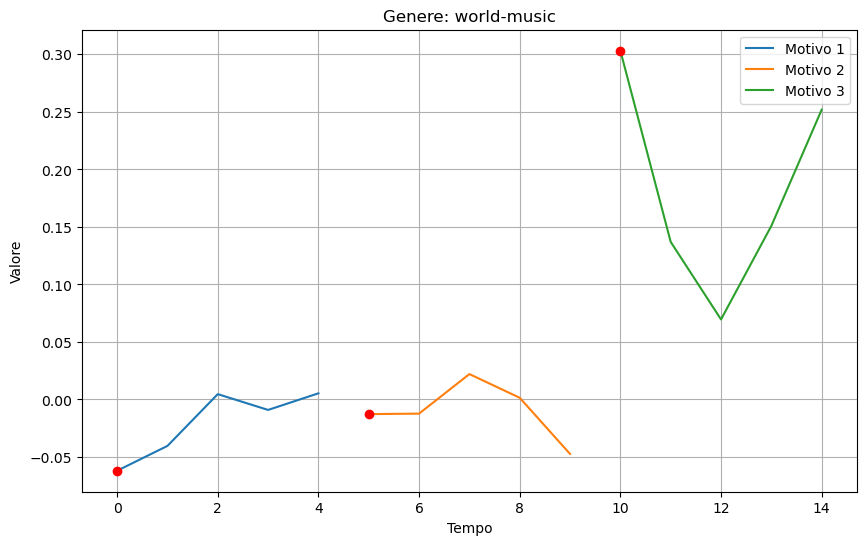

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 2

# Iteriamo su ogni genere
for genere in generi_unici:
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


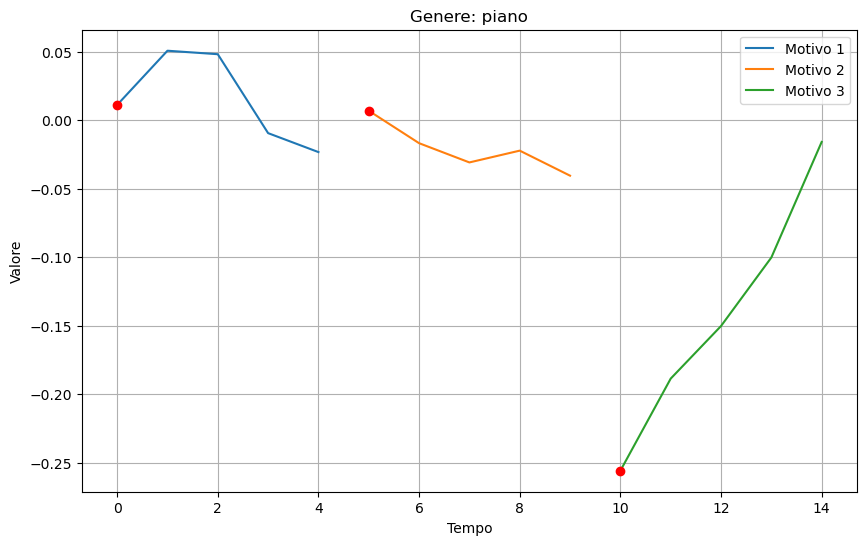

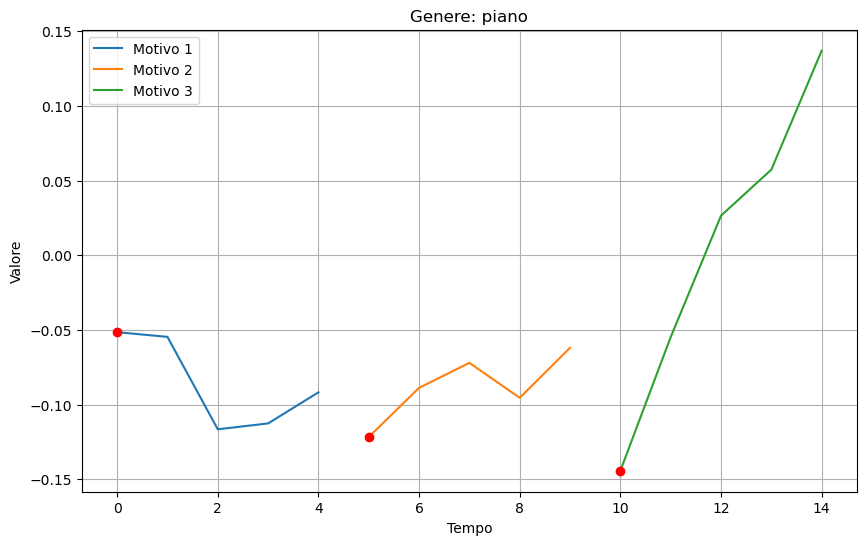

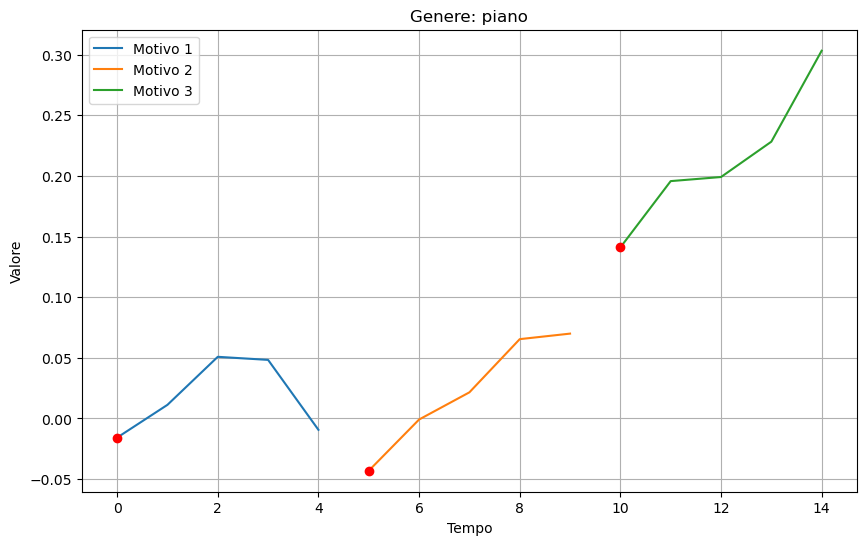

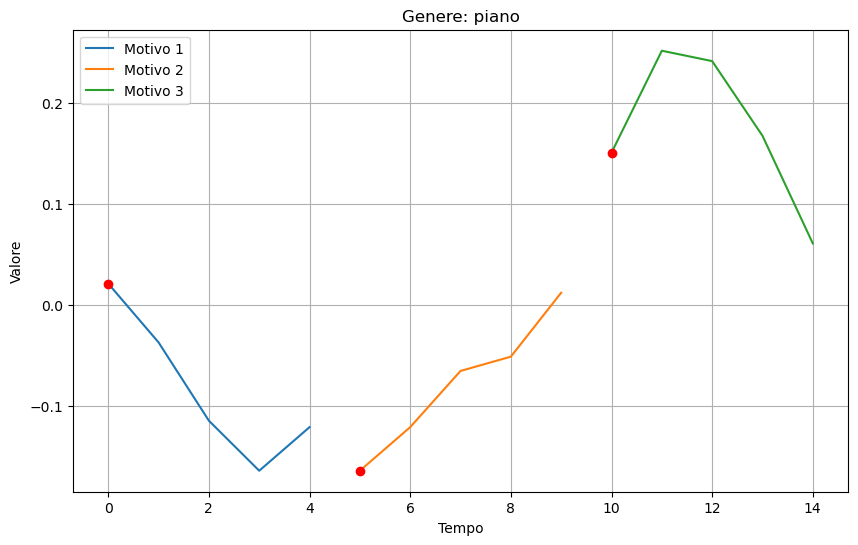

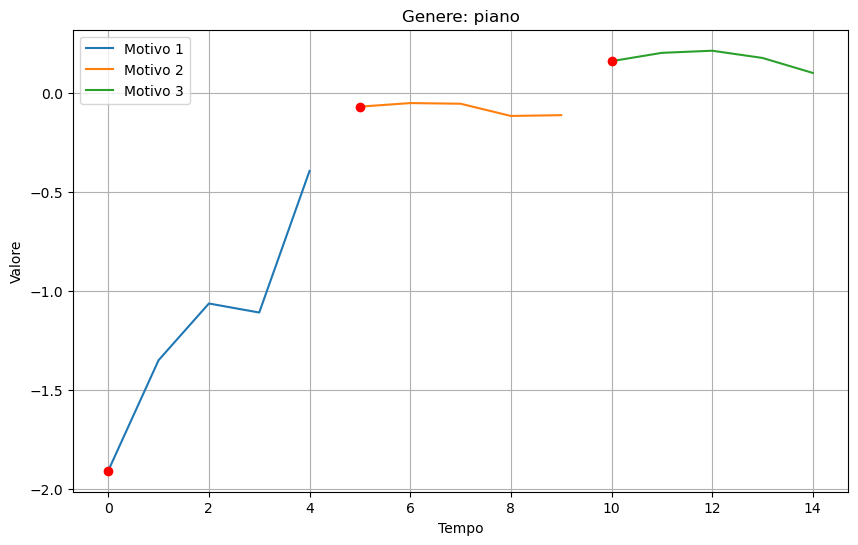

...

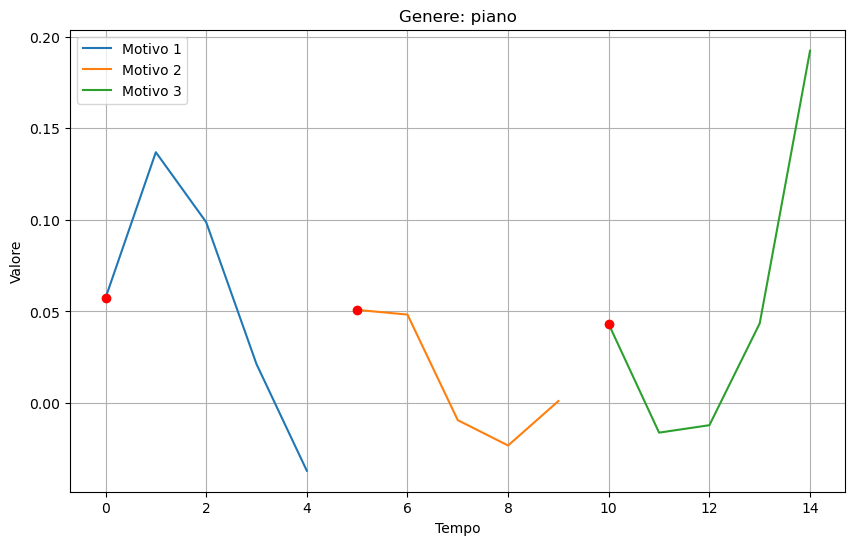

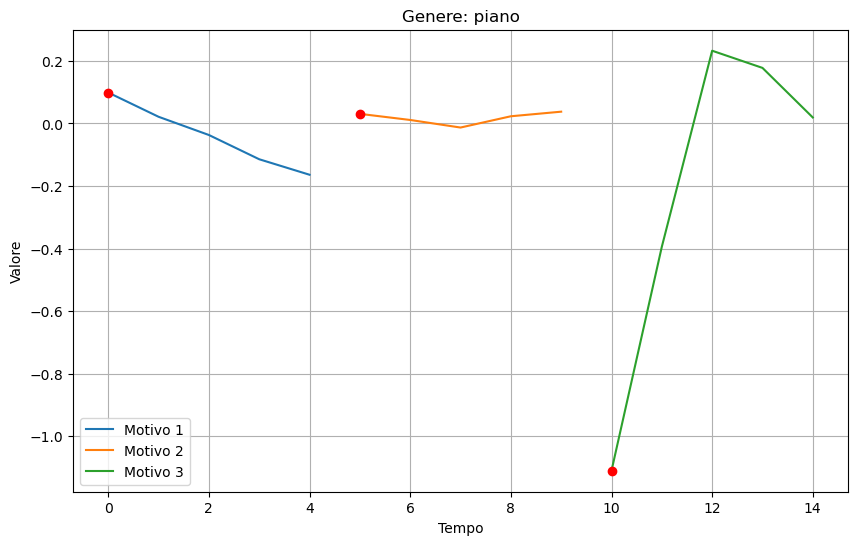

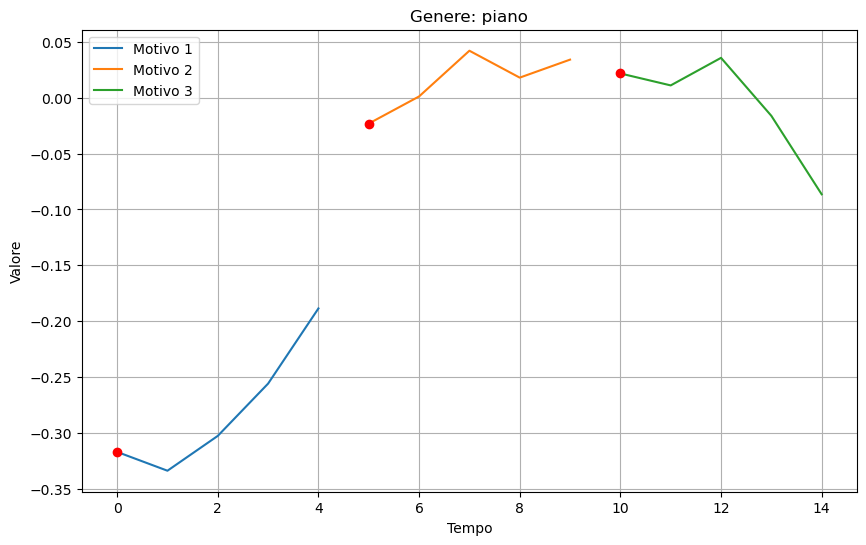

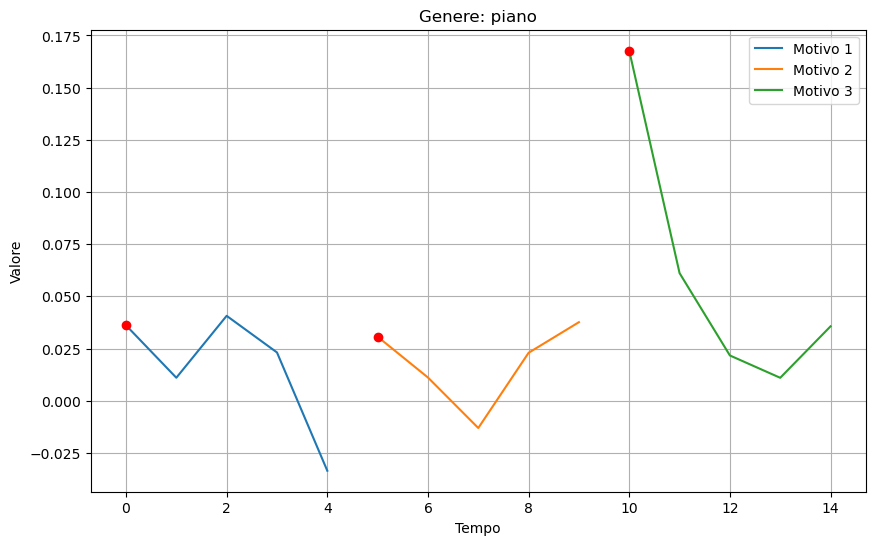

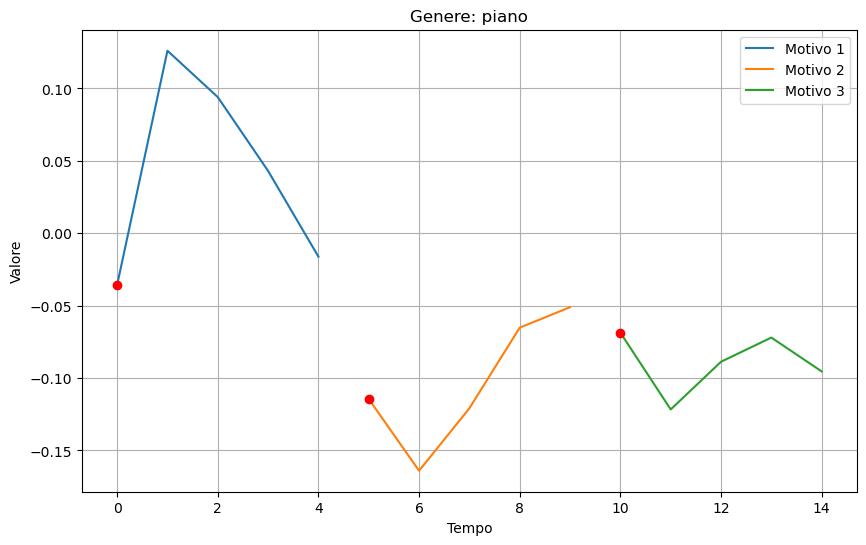

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Genere selezionato
genere_selezionato = "piano"

# Trova gli indici delle serie temporali appartenenti al genere selezionato
indici_genere_selezionato = np.where(y_sampled == genere_selezionato)[0]

# Se non ci sono serie temporali per il genere selezionato, esci
if len(indici_genere_selezionato) == 0:
    print(f"Nessuna serie temporale trovata per il genere {genere_selezionato}")
    exit()

# Iteriamo su ogni serie temporale per il genere selezionato
for indice_serie in indici_genere_selezionato:
    # Nome del genere
    nome_genere = f'Genere: {genere_selezionato}'
    
    # Serie temporale corrente
    serie_temporale = motif_array[indice_serie]
    
    # Primi elementi dei motivi interni
    primi_elementi_motivi = first_elements[indice_serie]
    
    # Creazione del grafico
    plt.figure(figsize=(10, 6))
    
    # Grano in cima con il nome del genere
    plt.title(nome_genere)
    
    # Serie temporale con i motivi rappresentati
    for i, motivo in enumerate(serie_temporale):
        plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
        plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
    
    # Impostazioni aggiuntive del grafico
    plt.xlabel('Tempo')
    plt.ylabel('Valore')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
df_motif={'Motif': first_elements,
        'Genres': y_sampled,
         'ids': ids_sampled}
df_motif=pd.DataFrame(df_motif)

In [ ]:
df_motif

,Motif,Genres,ids
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw
...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768


In [ ]:
type(first_elements)

list

## Clustering Motif

## PCA

In [ ]:
from sklearn.decomposition import PCA
# Esegui la PCA per ridurre le dimensioni
pca = PCA(n_components=2)
X_pca = pca.fit_transform(first_elements)

In [ ]:
X_pca

array([[-0.00131535, -0.00315262],
       [-0.02618938,  0.05532206],
       [-0.0087642 , -0.07124888],
       ...,
       [-0.09576785, -0.06603554],
       [-0.05587469,  0.08797733],
       [ 0.0404497 , -0.12927917]])

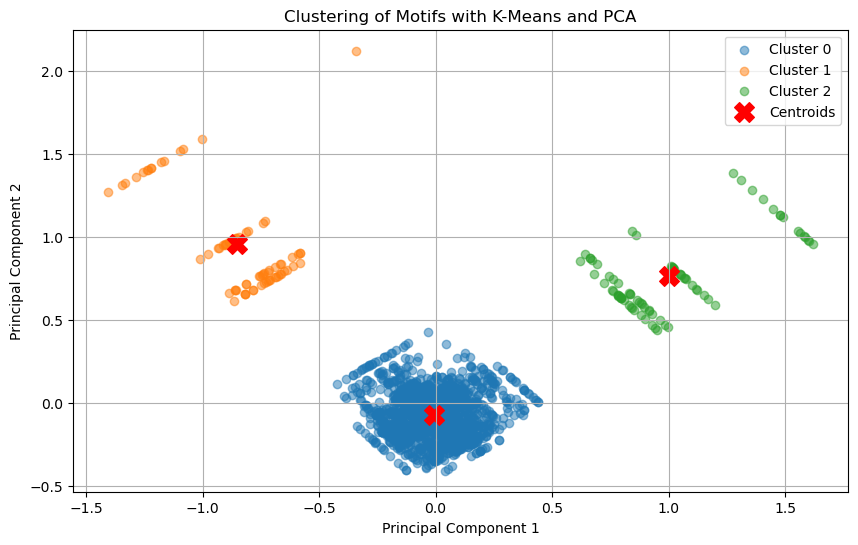

In [ ]:
from sklearn.cluster import KMeans
# Esegui il clustering con K-Means sui componenti PCA
kmeans = KMeans(n_clusters=3, random_state=94)
kmeans.fit(X_pca)

# Ottieni le etichette dei cluster assegnate
cluster_labels = kmeans.labels_

# Plot dei risultati
plt.figure(figsize=(10, 6))
for cluster in range(3):
    motifs = X_pca[cluster_labels == cluster]  # Seleziona i motifs appartenenti al cluster corrente
    plt.scatter(motifs[:, 0], motifs[:, 1], label=f'Cluster {cluster}', alpha=0.5)

# Plot dei centroidi
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='X', s=200, c='red', label='Centroids')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clustering of Motifs with K-Means and PCA')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
df_motif

,Motif,Genres,ids
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw
...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768


In [ ]:
df_motif['Cluster_Label']=kmeans.labels_

In [ ]:
df_motif['Cluster_Label'] = df_motif['Cluster_Label'].map({0:"A", 1: "B", 2: "C"})

In [ ]:
df_motif

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,A
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,A
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


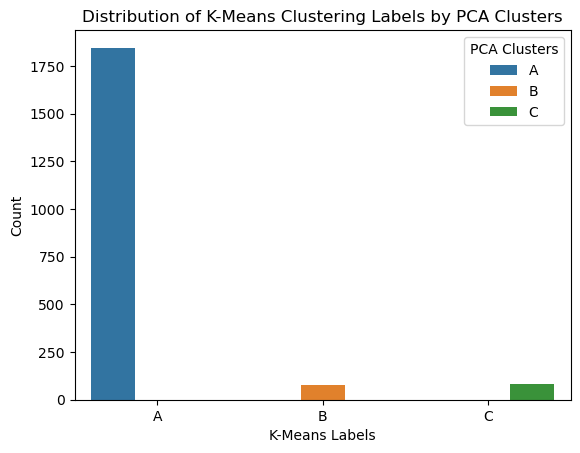

In [ ]:
import seaborn as sns

# Plot della distribuzione dei cluster assegnati dalla PCA
sns.countplot(data=df_motif, x='Cluster_Label', hue='Cluster_Label')
plt.xlabel('K-Means Labels')
plt.ylabel('Count')
plt.title('Distribution of K-Means Clustering Labels by PCA Clusters')
plt.legend(title='PCA Clusters')
plt.show()


In [ ]:
df_motif.columns

Index(['Motif', 'Genres', 'ids', 'Cluster_Label'], dtype='object')

In [ ]:
centroids = kmeans.cluster_centers_
print("Centroidi dei cluster:")
print(centroids)

Centroidi dei cluster:
[[-0.00889209 -0.07189751]
 [-0.85096163  0.95542936]
 [ 1.00285042  0.76242132]]


## Merge 

In [ ]:
dataset=pd.read_csv('nuovo_dataset_totale.csv')

In [ ]:
dataset

,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,album_type,album_name,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,4rjA5kJJWbwU1prXCvg6Fk,Grey,1.0,290.48,False,52.0,5.0,Kölsch,album,1989,...,0.24,186.00,3.0,0.02,1.00,0.50,0.52,234.0,minimal-techno,[51.0]
1,6xzpUzzIquIyUzTLbbgSdI,Thrown,1.0,539.23,False,45.0,5.0,Kiasmos,album,Kiasmos,...,0.14,120.02,4.0,0.68,0.33,0.41,0.59,269.0,minimal-techno,[47.0]
2,56tXgHlSHCfgmGhwVXNizc,Routine,1.0,264.20,False,39.0,5.0,Joris Delacroix,album,Night Visions,...,0.32,118.05,3.0,0.85,0.46,0.90,0.76,171.0,minimal-techno,[44.0]
3,0s3wIBczp6TdSJ2y8cveJl,Confronted - Anfisa Letyago Stranger Remix,1.0,387.41,False,0.0,6.0,Pan-Pot;Anfisa Letyago,single,Confronted Remixes,...,0.04,128.99,4.0,0.88,0.50,0.51,0.50,207.0,minimal-techno,"[36.0, 40.0]"
4,4PSbDDd1LRYMhqPXvza6I2,Jupiter Sunrise,1.0,248.96,False,0.0,1.0,Kollektiv Turmstrasse,compilation,10 Years Diynamic,...,0.12,120.00,4.0,0.88,1.00,0.47,0.46,123.0,minimal-techno,[45.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109144,0wiDjWz3U1WfwXSrWHXe2b,I'm Good (Blue) - REAPER Extended Remix,1.0,209.66,True,23.0,2.0,David Guetta;Bebe Rexha;REAPER,single,I'm Good (Blue) [REAPER Remix],...,0.37,173.96,4.0,0.73,1.00,0.09,0.18,145.0,edm,"[86.0, 79.0, 50.0]"
109145,46n9OJc7LOIVdj8t2l5WA5,End Of The Night,1.0,205.72,True,56.0,1.0,Danny Avila,single,End Of The Night,...,0.31,99.97,4.0,0.71,1.00,0.40,0.54,84.0,edm,[47.0]
109146,127uq83uGFapbddqiMUKky,Sexy Bitch (feat. Akon),1.0,195.85,True,80.0,3.0,David Guetta;Akon,album,One More Love,...,0.80,130.01,4.0,0.81,0.99,0.10,0.33,106.0,edm,"[86.0, 79.0]"
109147,0ZdUHFxifUJNqo7G4aJzoF,Savannah,1.0,208.70,False,60.0,1.0,Diviners;Philly K.,single,Savannah,...,0.39,108.07,4.0,0.65,1.00,0.55,0.60,89.0,edm,"[47.0, 38.0]"


In [ ]:
dataset_merged_after_c = pd.merge(df_motif, dataset, left_on=['ids', 'Genres'], right_on=['id', 'genre'], how='inner')

In [ ]:
dataset_merged_after_c=dataset_merged_after_c.drop(['ids', 'Genres'], axis=1)

In [ ]:
dataset_merged_after_c

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",A,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",A,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


In [ ]:
dataset_merged_after_c['valence']

0       0.11
1       0.18
2       0.30
3       0.07
4       0.65
        ... 
1995    0.29
1996    0.92
1997    0.75
1998    0.76
1999    0.38
Name: valence, Length: 2000, dtype: float64

In [ ]:
dataset_merged_after_c['Motif'].tolist()

[[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696],
 [-0.10017519152907285, 0.040659776628233564, -0.06191469653133186],
 [0.010966835784340198, -0.3338457138023082, 0.001088733910758793],
 [-0.02318040021042633, 0.0013248255658865286, 0.23248481166178803],
 [0.050840185570961455, -0.11649967694109602, -0.022132684604599603],
 [-0.2181040490337499, -0.3338457138023082, 0.03313188243560628],
 [0.19232169535512794, -0.28931324425519145, -0.15021012143150622],
 [0.24160517772080184, 0.08659714205090542, 0.045448131390106936],
 [0.24160517772080184, -0.15021012143150622, 0.0014925840628656952],
 [-0.12084160075464619, -0.04041042988183319, -0.09272366725537612],
 [0.177569741094804, 0.012265179686463816, -0.00934486145391183],
 [-0.048078031363184115, -0.11649967694109602, -0.05477139374163009],
 [0.05723904670724786, -0.022132684604599603, -0.046891652033747615],
 [-0.012096304455615622, -0.01576149177678871, 0.007171209758129033],
 [0.04304090998243482, 0.19232169535512

In [ ]:
dataset_merged_after_c.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [ ]:
dataset_merged_after_c

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",A,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",A,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


## Analisi 

In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_A_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_A = cluster_A_data['genre'].value_counts()

print(frequenza_generi_cluster_A)


progressive-house    97
new-age              96
salsa                95
goth                 94
songwriter           94
happy                94
folk                 93
opera                92
synth-pop            92
j-idol               92
piano                92
minimal-techno       91
world-music          91
heavy-metal          91
emo                  91
honky-tonk           91
kids                 90
sertanejo            90
mpb                  90
sleep                89
Name: genre, dtype: int64


In [ ]:
frequenza_generi_cluster_A[:6]

progressive-house    97
new-age              96
salsa                95
goth                 94
songwriter           94
happy                94
Name: genre, dtype: int64

## Grafici di comparazione

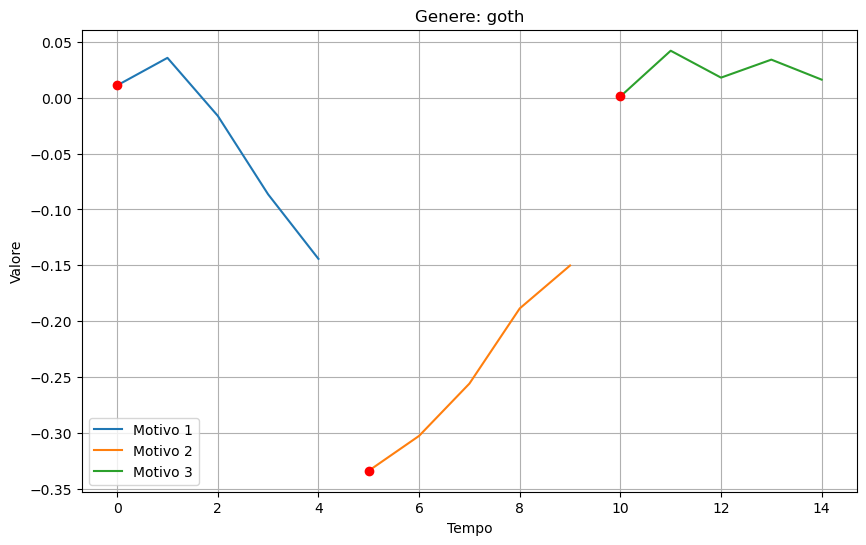

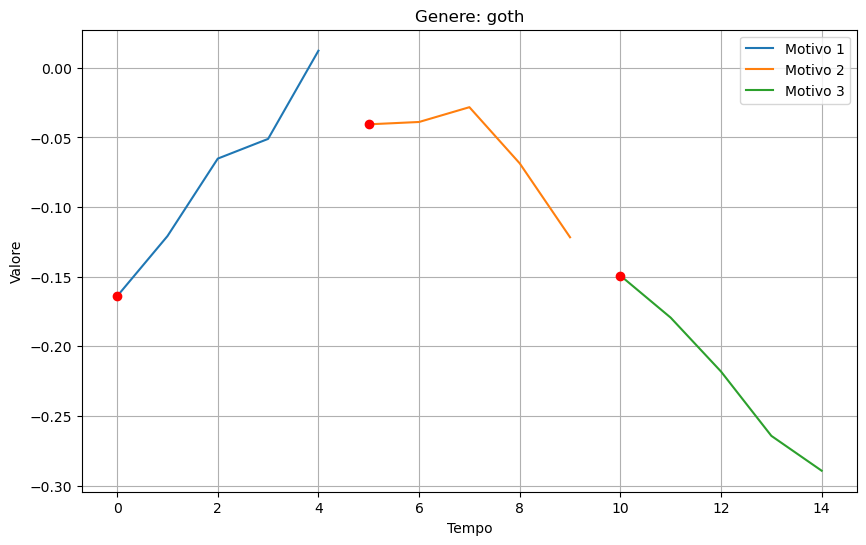

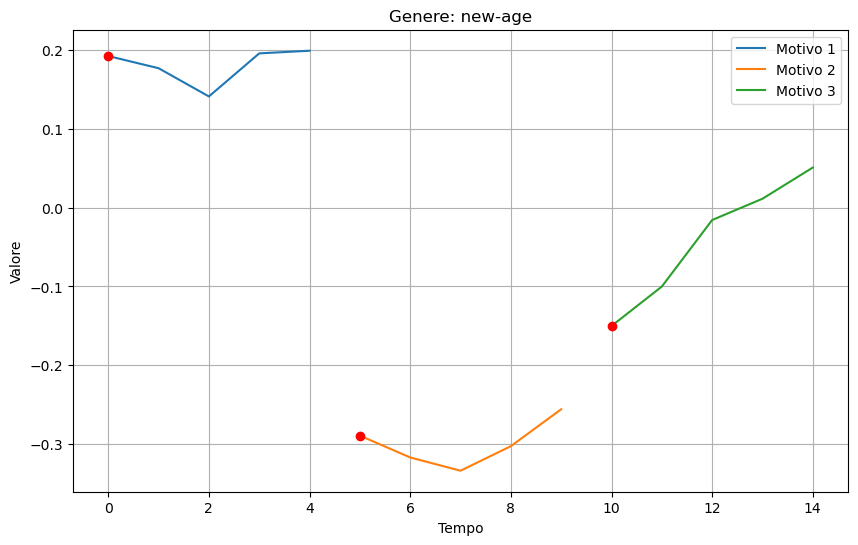

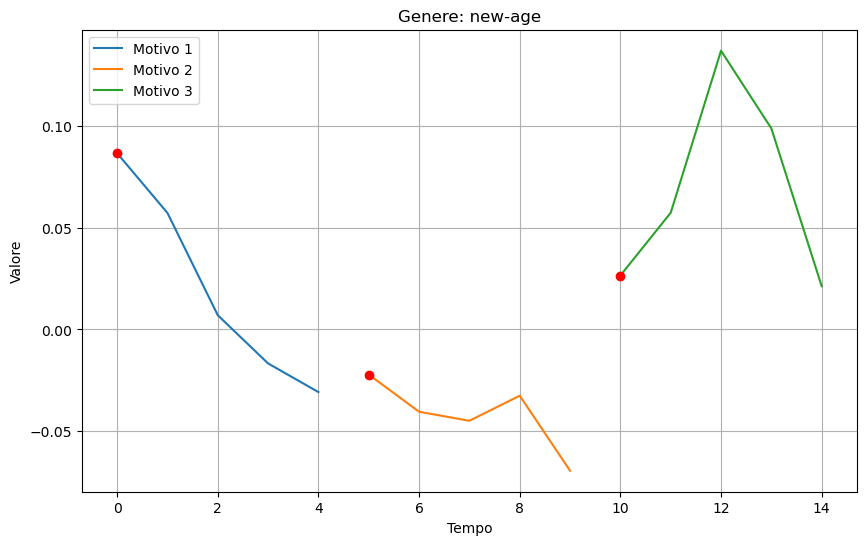

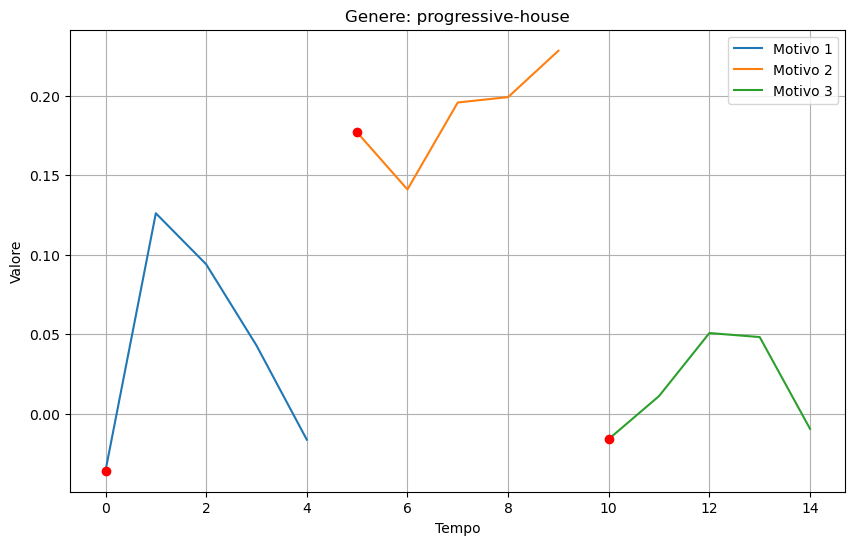

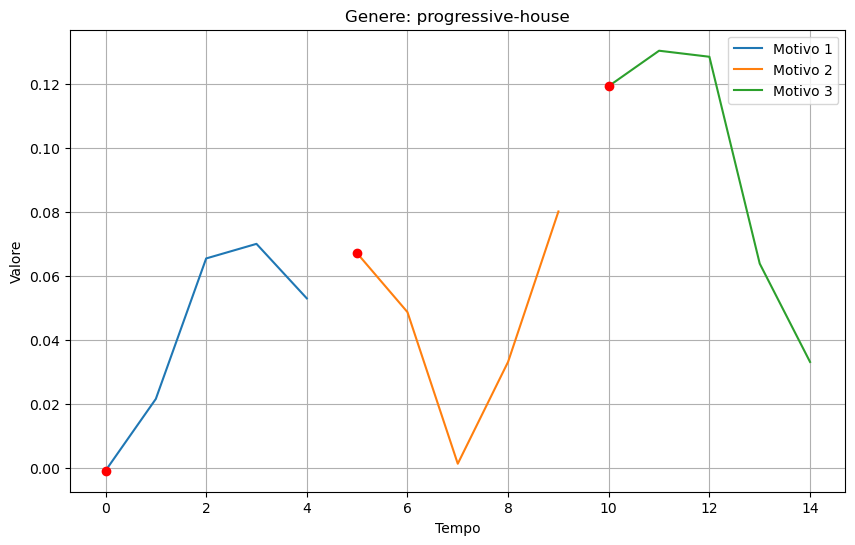

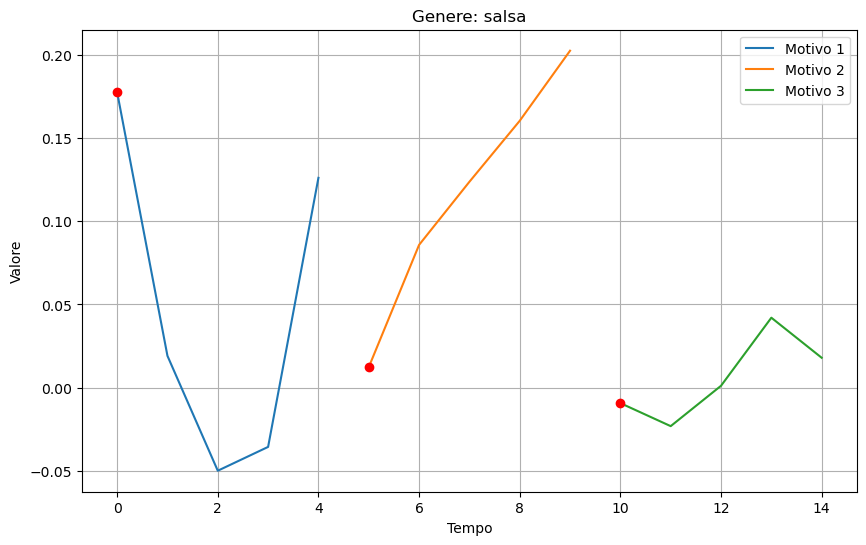

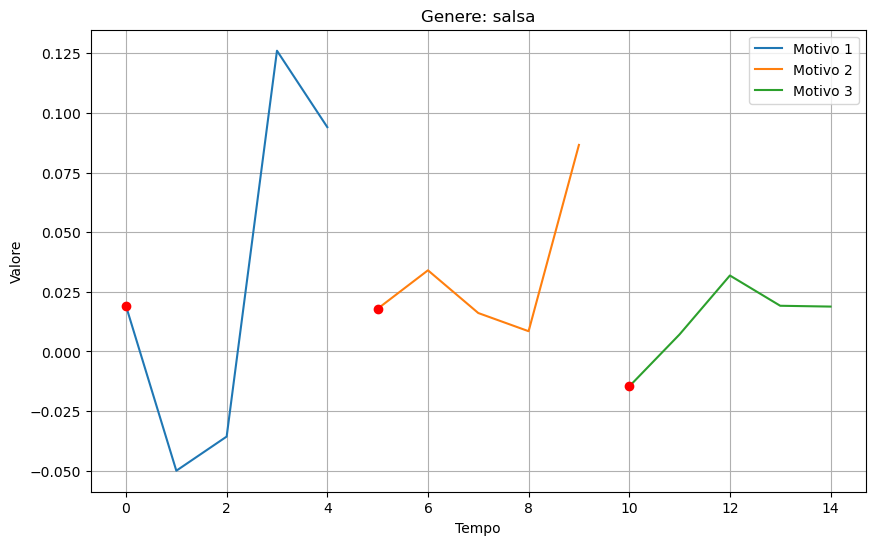

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 2

# Iteriamo su ogni genere
for genere in generi_unici:
    # Se il genere non è 'emo' o 'rock', passa al prossimo genere
    if genere not in ['progressive-house', 'new-age', 'salsa', 'goth']:
        continue
    
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_B_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_B = cluster_B_data['genre'].value_counts()

print(frequenza_generi_cluster_B)


kids                 8
mpb                  6
sertanejo            6
sleep                6
minimal-techno       5
world-music          5
honky-tonk           5
piano                4
emo                  4
songwriter           4
folk                 3
j-idol               3
happy                3
synth-pop            3
new-age              3
progressive-house    2
salsa                2
heavy-metal          1
goth                 1
opera                1
Name: genre, dtype: int64


In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_C_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_C = cluster_C_data['genre'].value_counts()

print(frequenza_generi_cluster_C)


heavy-metal          8
opera                7
emo                  5
goth                 5
sleep                5
j-idol               5
synth-pop            5
sertanejo            4
minimal-techno       4
world-music          4
piano                4
folk                 4
mpb                  4
honky-tonk           4
happy                3
salsa                3
songwriter           2
kids                 2
progressive-house    1
new-age              1
Name: genre, dtype: int64


## Popolarità 

In [ ]:
dataset_merged_after_c.columns

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_A = cluster_A['popularity'].mean()

print("Media di popolarità per il cluster A:", media_popolarita_cluster_A)

Media di popolarità per il cluster A: 34.77615176151762


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_B = cluster_B['popularity'].mean()

print("Media di popolarità per il cluster B:", media_popolarita_cluster_B)

Media di popolarità per il cluster B: 34.306666666666665


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_C = cluster_C['popularity'].mean()

print("Media di popolarità per il cluster C:", media_popolarita_cluster_C)

Media di popolarità per il cluster C: 33.425


## Duration

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_duration_cluster_A = cluster_A['duration_ms'].mean()

print("Media di duration per il cluster A:", media_duration_cluster_A)

Media di duration per il cluster A: 239.2080975609758


In [ ]:
# Seleziona solo le righe relative al cluster B
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_duration_cluster_B = cluster_B['duration_ms'].mean()

print("Media di duration per il cluster B:", media_duration_cluster_B)

Media di duration per il cluster B: 217.38613333333322


In [ ]:
# Seleziona solo le righe relative al cluster C
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_duration_cluster_C = cluster_C['duration_ms'].mean()

print("Media di duration per il cluster C:", media_duration_cluster_C)

Media di duration per il cluster C: 243.16012500000002


## Danceability

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_danceability_cluster_A = cluster_A['danceability'].mean()

print("Media di danzabilità per il cluster A:", media_danceability_cluster_A)

Media di danzabilità per il cluster A: 0.5287642276422764


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_danceability_cluster_B = cluster_B['danceability'].mean()

print("Media di danzabilità per il cluster B:", media_danceability_cluster_B)

Media di danzabilità per il cluster B: 0.5393333333333332


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_danceability_cluster_C = cluster_C['danceability'].mean()

print("Media di danzabilità per il cluster C:", media_danceability_cluster_C)

Media di danzabilità per il cluster C: 0.49474999999999997


## Valence 

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_valence_cluster_A = cluster_A['valence'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_valence_cluster_B = cluster_B['valence'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_valence_cluster_C = cluster_C['valence'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## Energy

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['energy'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['energy'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['energy'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## acousticness

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['acousticness'].mean()

print("Media di acousticness per il cluster A:", media_valence_cluster_A)

Media di acousticness per il cluster A: 0.4257886178861782


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['acousticness'].mean()

print("Media di acousticness per il cluster B:", media_valence_cluster_B)

Media di acousticness per il cluster B: 0.44400000000000006


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['acousticness'].mean()

print("Media di acousticness per il cluster C:", media_valence_cluster_C)

Media di acousticness per il cluster C: 0.44187500000000013


## Liveness

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_liveness_cluster_A = cluster_A['liveness'].mean()

print("Media di liveness per il cluster A:", media_liveness_cluster_A)

Media di liveness per il cluster A: 0.2242872628726293


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_liveness_cluster_B = cluster_B['liveness'].mean()

print("Media di liveness per il cluster B:", media_liveness_cluster_B)

Media di liveness per il cluster B: 0.26786666666666664


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_liveness_cluster_C = cluster_C['liveness'].mean()

print("Media di liveness per il cluster C:", media_liveness_cluster_C)

Media di liveness per il cluster C: 0.23962499999999998


## N bars

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_n_bars_cluster_A = cluster_A['n_bars'].mean()

print("Media di n bars per il cluster A:", media_n_bars_cluster_A)

Media di n bars per il cluster A: 122.38915989159892


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_n_bars_cluster_B = cluster_B['n_bars'].mean()

print("Media di n bars per il cluster B:", media_n_bars_cluster_B)

Media di n bars per il cluster B: 107.0


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_n_bars_cluster_C = cluster_C['n_bars'].mean()

print("Media di n bars per il cluster C:", media_n_bars_cluster_C)

Media di n bars per il cluster C: 128.7625


## Estrazione motif più rappresentativi

In [ ]:
dataset_merged_after_c.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [ ]:
# Lista dei generi più frequenti
generi_rappresentativi = ['progressive-house', 'new-age', 'salsa', 'goth', 'songwriter', 'happy']

# Step 1: Seleziona solo i dati relativi ai generi più frequenti nel cluster A
dati_generi_frequenti = dataset_merged_after_c[dataset_merged_after_c['genre'].isin(generi_rappresentativi)]

# Step 2: Filtra i dati per includere solo le righe con etichetta di cluster 'A'
dati_cluster_A = dati_generi_frequenti[dati_generi_frequenti['Cluster_Label'] == 'A']

# Step 3: Estrai i dati dei motif e dei generi
motif_e_generi_associati = dati_cluster_A[['Motif', 'genre']]

# Ora 'motif_e_generi_associati' contiene sia i dati dei motif che dei generi associati ai generi più frequenti nel cluster A
motif_e_generi_associati


,Motif,genre
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth
6,"[0.19232169535512794, -0.28931324425519145, -0...",new-age
10,"[0.177569741094804, 0.012265179686463816, -0.0...",salsa
23,"[0.010996084282132425, 0.02135896369349284, 0.0]",happy
24,"[0.01907160082182441, 0.017923112688859152, -0...",salsa
...,...,...
1994,"[-0.2642727869360493, -0.15021012143150622, 0....",salsa
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa


In [ ]:
# Lista dei generi più frequenti
generi_rappresentativi = ['progressive-house', 'new-age', 'salsa', 'goth', 'songwriter', 'happy']

# Step 1: Seleziona solo i dati relativi ai generi più frequenti nel cluster A
dati_generi_frequenti = dataset_merged_after_c[dataset_merged_after_c['genre'].isin(generi_rappresentativi)]

# Step 2: Filtra i dati per includere solo le righe con etichetta di cluster 'A'
dati_cluster_A = dati_generi_frequenti[dati_generi_frequenti['Cluster_Label'] == 'A']

# Step 3: Raggruppa i dati per genere e aggrega i motif
motif_raggruppati_per_genere = dati_cluster_A.groupby('genre')['Motif'].apply(list).reset_index()




In [ ]:
motif_raggruppati_per_genere

,genre,Motif
0,goth,"[[0.010966835784340198, -0.3338457138023082, 0..."
1,happy,"[[0.010996084282132425, 0.02135896369349284, 0..."
2,new-age,"[[0.19232169535512794, -0.28931324425519145, -..."
3,progressive-house,"[[-0.03565899680020941, 0.17685991628990436, -..."
4,salsa,"[[0.177569741094804, 0.012265179686463816, -0...."
5,songwriter,"[[-0.14423378954133048, -0.09272366725537612, ..."


In [ ]:
import pandas as pd

# Supponiamo che 'motif_raggruppati_per_genere' sia il DataFrame contenente i motif raggruppati per genere

# Calcola la correlazione di Pearson
correlazione_pearson = dataset_merged_after_c.set_index('genre').corr(method='pearson')

# Calcola la correlazione di Spearman
correlazione_spearman = motif_raggruppati_per_genere.set_index('genre').corr(method='spearman')

# Visualizza le correlazioni
print("Correlazione di Pearson:")
print(correlazione_pearson)
print("\nCorrelazione di Spearman:")
print(correlazione_spearman)


Correlazione di Pearson:
Empty DataFrame
Columns: []
Index: []

Correlazione di Spearman:
Empty DataFrame
Columns: []
Index: []


## Senza PCA

In [ ]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform

# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [ ]:
first_elements

[[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696],
 [-0.10017519152907285, 0.040659776628233564, -0.06191469653133186],
 [0.010966835784340198, -0.3338457138023082, 0.001088733910758793],
 [-0.02318040021042633, 0.0013248255658865286, 0.23248481166178803],
 [0.050840185570961455, -0.11649967694109602, -0.022132684604599603],
 [-0.2181040490337499, -0.3338457138023082, 0.03313188243560628],
 [0.19232169535512794, -0.28931324425519145, -0.15021012143150622],
 [0.24160517772080184, 0.08659714205090542, 0.045448131390106936],
 [0.24160517772080184, -0.15021012143150622, 0.0014925840628656952],
 [-0.12084160075464619, -0.04041042988183319, -0.09272366725537612],
 [0.177569741094804, 0.012265179686463816, -0.00934486145391183],
 [-0.048078031363184115, -0.11649967694109602, -0.05477139374163009],
 [0.05723904670724786, -0.022132684604599603, -0.046891652033747615],
 [-0.012096304455615622, -0.01576149177678871, 0.007171209758129033],
 [0.04304090998243482, 0.19232169535512

In [ ]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(first_elements)

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_minmax)


KMeans(max_iter=100, n_clusters=3, random_state=94)

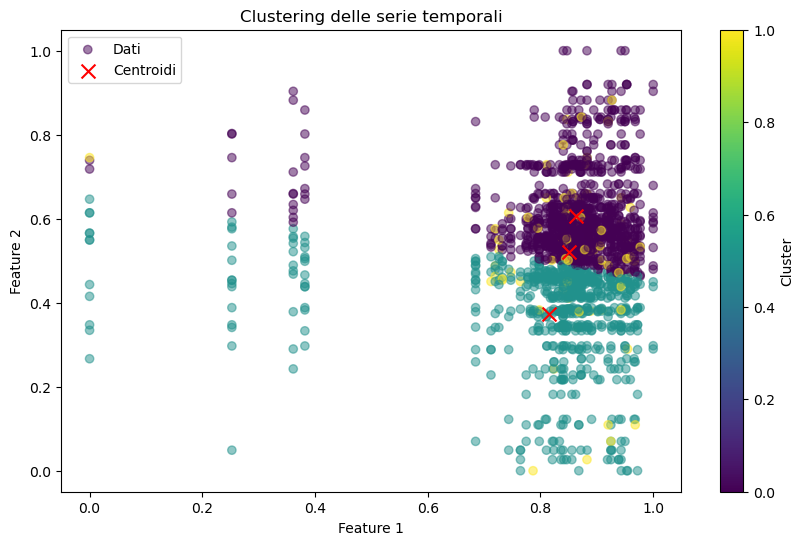

In [ ]:
# Plot degli scatter plot colorati per cluster
plt.figure(figsize=(10, 6))

# Estrai le etichette di clustering
labels = kmeans.labels_

# Plot dei punti
plt.scatter(X_minmax[:, 0], X_minmax[:, 1], c=labels, cmap='viridis', alpha=0.5, label='Dati')

# Plot dei centroidi
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, color='red', label='Centroidi')

# Aggiungi le etichette degli assi
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Clustering delle serie temporali')

plt.colorbar(label='Cluster')
plt.legend()
plt.show()

In [ ]:
df_motif_2={'Motif': first_elements,
        'Genres': y_sampled,
         'ids': ids_sampled}
df_motif_2=pd.DataFrame(df_motif_2)

In [ ]:
df_motif_2['Cluster_Label']=kmeans.labels_

In [ ]:
df_motif_2['Cluster_Label'] = df_motif_2['Cluster_Label'].map({0:"A", 1: "B", 2: "C"})

In [ ]:
df_motif_2

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,B
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,B
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


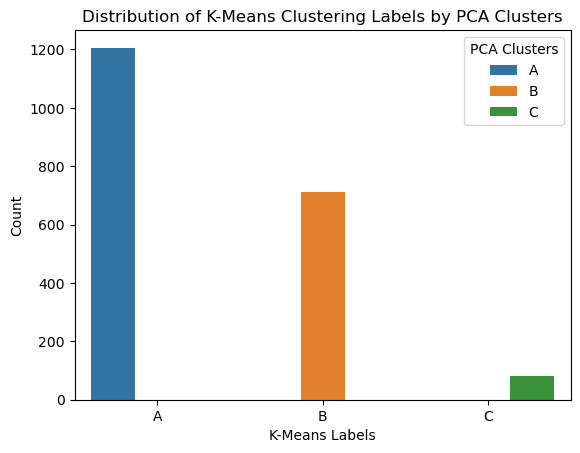

In [ ]:
import seaborn as sns

# Plot della distribuzione dei cluster assegnati dalla PCA
sns.countplot(data=df_motif_2, x='Cluster_Label', hue='Cluster_Label')
plt.xlabel('K-Means Labels')
plt.ylabel('Count')
plt.title('Distribution of K-Means Clustering Labels by PCA Clusters')
plt.legend(title='PCA Clusters')
plt.show()


In [ ]:
df_motif_2.columns

Index(['Motif', 'Genres', 'ids', 'Cluster_Label'], dtype='object')

In [ ]:
df_motif_2

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,B
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,B
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


## Merge 

In [ ]:
dataset_2=pd.read_csv('nuovo_dataset_totale.csv')

In [ ]:
dataset_2

,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,album_type,album_name,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,4rjA5kJJWbwU1prXCvg6Fk,Grey,1.0,290.48,False,52.0,5.0,Kölsch,album,1989,...,0.24,186.00,3.0,0.02,1.00,0.50,0.52,234.0,minimal-techno,[51.0]
1,6xzpUzzIquIyUzTLbbgSdI,Thrown,1.0,539.23,False,45.0,5.0,Kiasmos,album,Kiasmos,...,0.14,120.02,4.0,0.68,0.33,0.41,0.59,269.0,minimal-techno,[47.0]
2,56tXgHlSHCfgmGhwVXNizc,Routine,1.0,264.20,False,39.0,5.0,Joris Delacroix,album,Night Visions,...,0.32,118.05,3.0,0.85,0.46,0.90,0.76,171.0,minimal-techno,[44.0]
3,0s3wIBczp6TdSJ2y8cveJl,Confronted - Anfisa Letyago Stranger Remix,1.0,387.41,False,0.0,6.0,Pan-Pot;Anfisa Letyago,single,Confronted Remixes,...,0.04,128.99,4.0,0.88,0.50,0.51,0.50,207.0,minimal-techno,"[36.0, 40.0]"
4,4PSbDDd1LRYMhqPXvza6I2,Jupiter Sunrise,1.0,248.96,False,0.0,1.0,Kollektiv Turmstrasse,compilation,10 Years Diynamic,...,0.12,120.00,4.0,0.88,1.00,0.47,0.46,123.0,minimal-techno,[45.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109144,0wiDjWz3U1WfwXSrWHXe2b,I'm Good (Blue) - REAPER Extended Remix,1.0,209.66,True,23.0,2.0,David Guetta;Bebe Rexha;REAPER,single,I'm Good (Blue) [REAPER Remix],...,0.37,173.96,4.0,0.73,1.00,0.09,0.18,145.0,edm,"[86.0, 79.0, 50.0]"
109145,46n9OJc7LOIVdj8t2l5WA5,End Of The Night,1.0,205.72,True,56.0,1.0,Danny Avila,single,End Of The Night,...,0.31,99.97,4.0,0.71,1.00,0.40,0.54,84.0,edm,[47.0]
109146,127uq83uGFapbddqiMUKky,Sexy Bitch (feat. Akon),1.0,195.85,True,80.0,3.0,David Guetta;Akon,album,One More Love,...,0.80,130.01,4.0,0.81,0.99,0.10,0.33,106.0,edm,"[86.0, 79.0]"
109147,0ZdUHFxifUJNqo7G4aJzoF,Savannah,1.0,208.70,False,60.0,1.0,Diviners;Philly K.,single,Savannah,...,0.39,108.07,4.0,0.65,1.00,0.55,0.60,89.0,edm,"[47.0, 38.0]"


In [ ]:
dataset_merged_after_c_2 = pd.merge(df_motif_2, dataset_2, left_on=['ids', 'Genres'], right_on=['id', 'genre'], how='inner')

In [ ]:
dataset_merged_after_c_2=dataset_merged_after_c_2.drop(['ids', 'Genres'], axis=1)

In [ ]:
dataset_merged_after_c_2

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",B,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",B,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


In [ ]:
dataset_merged_after_c_2['valence']

0       0.11
1       0.18
2       0.30
3       0.07
4       0.65
        ... 
1995    0.29
1996    0.92
1997    0.75
1998    0.76
1999    0.38
Name: valence, Length: 2000, dtype: float64

## Analisi delle correlazioni

In [ ]:
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

In [ ]:
cluster_A

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
7,"[0.24160517772080184, 0.08659714205090542, 0.0...",A,3SdJZFJWYHymvxUrMPAXdQ,Táxi Lunar (Ao Vivo),1.0,237.27,False,45.0,2.0,Zé Ramalho,...,0.69,150.74,4.0,0.02,0.92,0.39,0.41,150.0,mpb,[62.0]
10,"[0.177569741094804, 0.012265179686463816, -0.0...",A,4SZI76W5PRBao0BhhIACpv,Vergüenza - Remastered,1.0,217.29,False,18.0,51.0,La Sonora Matancera,...,0.61,92.05,4.0,0.03,0.91,0.42,0.59,81.0,salsa,[54.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991,"[0.021296595150445057, 0.08659714205090542, -0...",A,28Obqqr7EtnSNul1TJiQcX,Oh Love,1.0,164.67,False,44.0,1.0,Delaney Bailey,...,0.56,148.10,4.0,0.55,0.98,0.33,0.41,96.0,songwriter,[57.0]
1992,"[0.25190315172445804, -0.0008595053556812499, ...",A,7qvGRrYCEOXLkg3ax9mfUb,Atrevida,1.0,276.89,False,45.0,13.0,Grupo Niche,...,0.92,93.28,4.0,0.02,1.00,0.30,0.44,106.0,salsa,[67.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]


In [ ]:
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

In [ ]:
from tslearn.shapelets import ShapeletModel, grabocka_params_to_shapelet_size_dict
import numpy as np

# Supponiamo che 'dataframe' sia il tuo DataFrame con la colonna di vettori di motif

# Estrai i vettori di motif dal DataFrame
motif_vectors = np.array(cluster_A['Motif'].tolist())

# Imposta i parametri per l'algoritmo FSD
shapelet_sizes = grabocka_params_to_shapelet_size_dict(n_shapelets_per_size={10: 5})
shp_clf = ShapeletModel(n_shapelets_per_size=shapelet_sizes,
                         optimizer="sgd", weight_regularizer=0.01,
                         max_iter=200, verbose_level=0)

# Addestra l'algoritmo FSD sui tuoi dati di serie temporali
shp_clf.fit(motif_vectors, y_train)  # Assumi che 'y_train' sia l'etichetta associata a ciascuna serie temporale

# Ottieni gli shapelet identificati
shapelets = shp_clf.shapelets_

# Visualizza gli shapelet identificati
for idx, shapelet in enumerate(shapelets):
    print(f"Shapelet {idx + 1}: Length {len(shapelet)}")


## Popolarità 

In [ ]:
dataset_merged_after_c_2.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_A = cluster_A['popularity'].mean()

print("Media di popolarità per il cluster A:", media_popolarita_cluster_A)

Media di popolarità per il cluster A: 34.82835820895522


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_B = cluster_B['popularity'].mean()

print("Media di popolarità per il cluster B:", media_popolarita_cluster_B)

Media di popolarità per il cluster B: 34.62692847124825


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_C = cluster_C['popularity'].mean()

print("Media di popolarità per il cluster C:", media_popolarita_cluster_C)

Media di popolarità per il cluster C: 33.54320987654321


## Duration

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_duration_cluster_A = cluster_A['duration_ms'].mean()

print("Media di duration per il cluster A:", media_duration_cluster_A)

Media di duration per il cluster A: 238.28440298507454


In [ ]:
# Seleziona solo le righe relative al cluster B
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_duration_cluster_B = cluster_B['duration_ms'].mean()

print("Media di duration per il cluster B:", media_duration_cluster_B)

Media di duration per il cluster B: 238.50478260869556


In [ ]:
# Seleziona solo le righe relative al cluster C
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_duration_cluster_C = cluster_C['duration_ms'].mean()

print("Media di duration per il cluster C:", media_duration_cluster_C)

Media di duration per il cluster C: 242.8495061728395


## Danceability

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_danceability_cluster_A = cluster_A['danceability'].mean()

print("Media di danzabilità per il cluster A:", media_danceability_cluster_A)

Media di danzabilità per il cluster A: 0.5246185737976778


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_danceability_cluster_B = cluster_B['danceability'].mean()

print("Media di danzabilità per il cluster B:", media_danceability_cluster_B)

Media di danzabilità per il cluster B: 0.5372650771388491


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_danceability_cluster_C = cluster_C['danceability'].mean()

print("Media di danzabilità per il cluster C:", media_danceability_cluster_C)

Media di danzabilità per il cluster C: 0.4918518518518517


## Valence 

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_valence_cluster_A = cluster_A['valence'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.42194029850746206


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_valence_cluster_B = cluster_B['valence'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.4345441795231416


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_valence_cluster_C = cluster_C['valence'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.4387654320987655


## Energy

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['energy'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['energy'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['energy'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## acousticness

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['acousticness'].mean()

print("Media di acousticness per il cluster A:", media_valence_cluster_A)

Media di acousticness per il cluster A: 0.4257886178861782


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['acousticness'].mean()

print("Media di acousticness per il cluster B:", media_valence_cluster_B)

Media di acousticness per il cluster B: 0.44400000000000006


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['acousticness'].mean()

print("Media di acousticness per il cluster C:", media_valence_cluster_C)

Media di acousticness per il cluster C: 0.44187500000000013


## Liveness

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_liveness_cluster_A = cluster_A['liveness'].mean()

print("Media di liveness per il cluster A:", media_liveness_cluster_A)

Media di liveness per il cluster A: 0.2242872628726293


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_liveness_cluster_B = cluster_B['liveness'].mean()

print("Media di liveness per il cluster B:", media_liveness_cluster_B)

Media di liveness per il cluster B: 0.26786666666666664


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_liveness_cluster_C = cluster_C['liveness'].mean()

print("Media di liveness per il cluster C:", media_liveness_cluster_C)

Media di liveness per il cluster C: 0.23962499999999998


## N bars

In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_n_bars_cluster_A = cluster_A['n_bars'].mean()

print("Media di n bars per il cluster A:", media_n_bars_cluster_A)

Media di n bars per il cluster A: 122.38915989159892


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_n_bars_cluster_B = cluster_B['n_bars'].mean()

print("Media di n bars per il cluster B:", media_n_bars_cluster_B)

Media di n bars per il cluster B: 107.0


In [ ]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_n_bars_cluster_C = cluster_C['n_bars'].mean()

print("Media di n bars per il cluster C:", media_n_bars_cluster_C)

Media di n bars per il cluster C: 128.7625


In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_A_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_A = cluster_A_data['genre'].value_counts()

print(frequenza_generi_cluster_A)


happy                71
world-music          70
folk                 66
synth-pop            65
salsa                65
sertanejo            64
opera                63
piano                60
honky-tonk           59
songwriter           59
sleep                58
progressive-house    58
minimal-techno       57
emo                  57
new-age              57
kids                 57
j-idol               56
goth                 56
heavy-metal          56
mpb                  52
Name: genre, dtype: int64


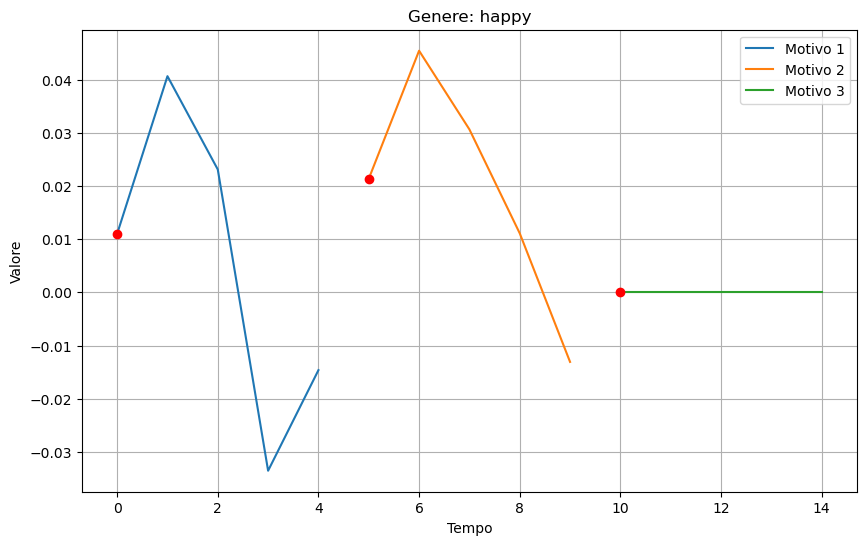

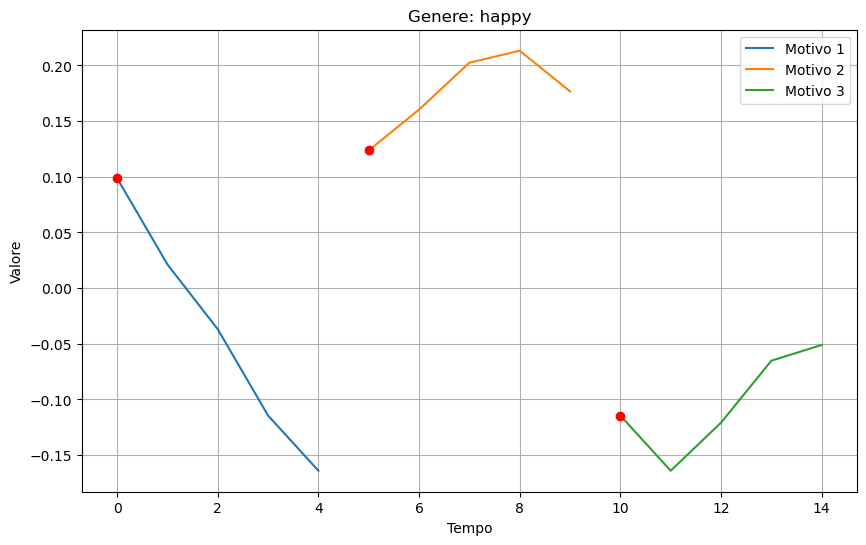

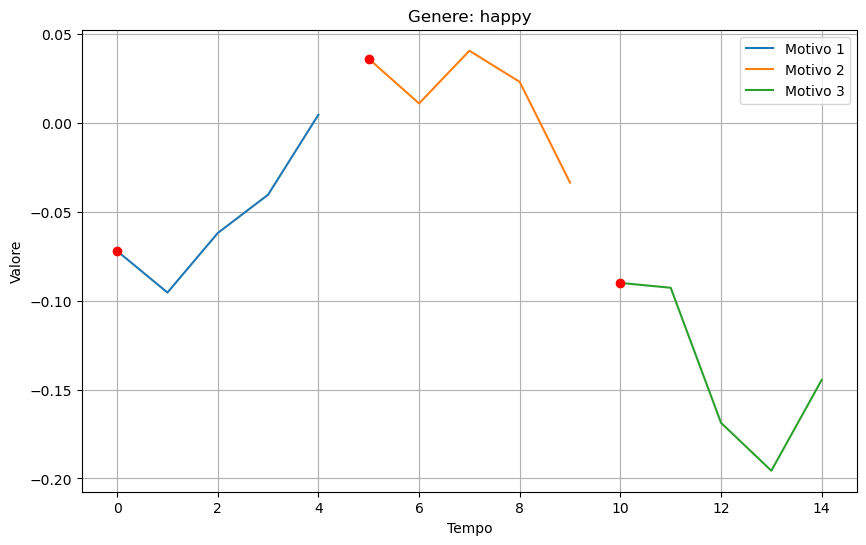

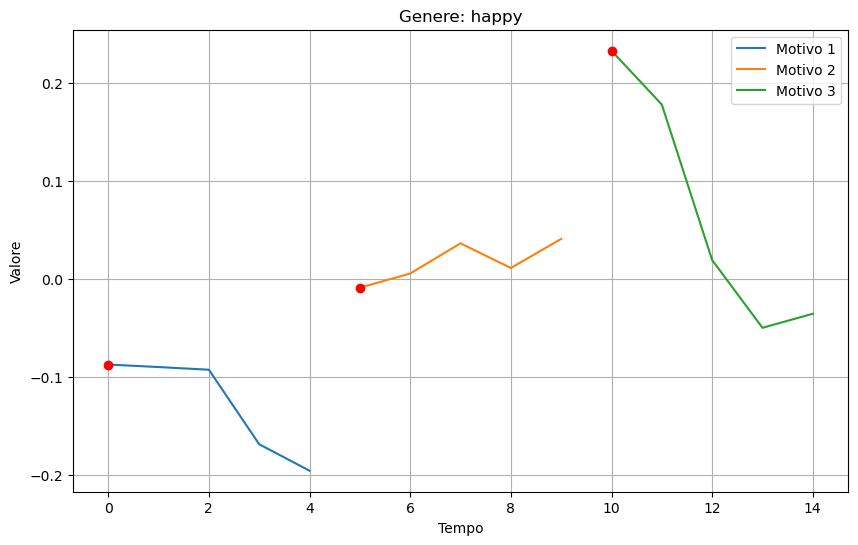

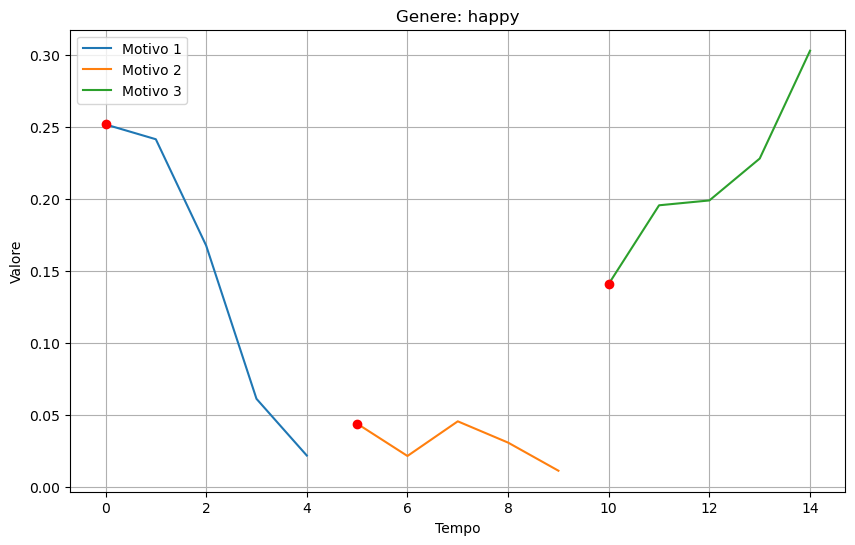

...

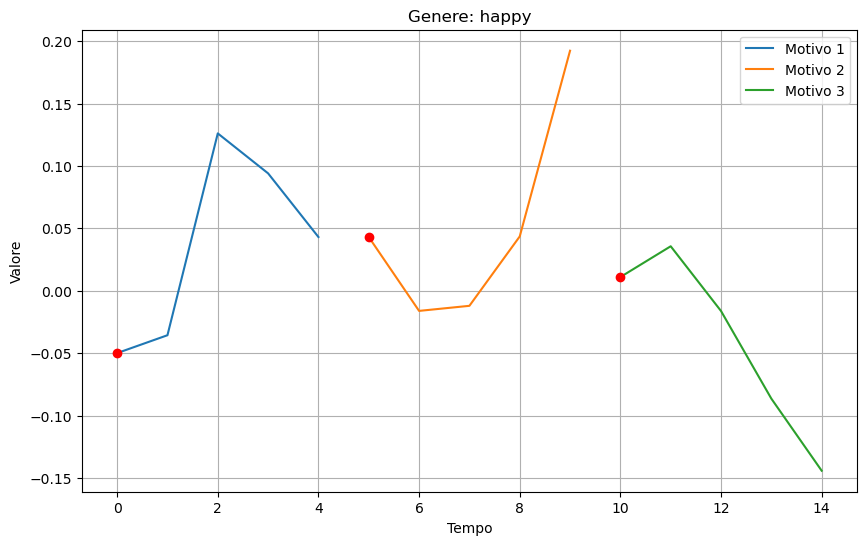

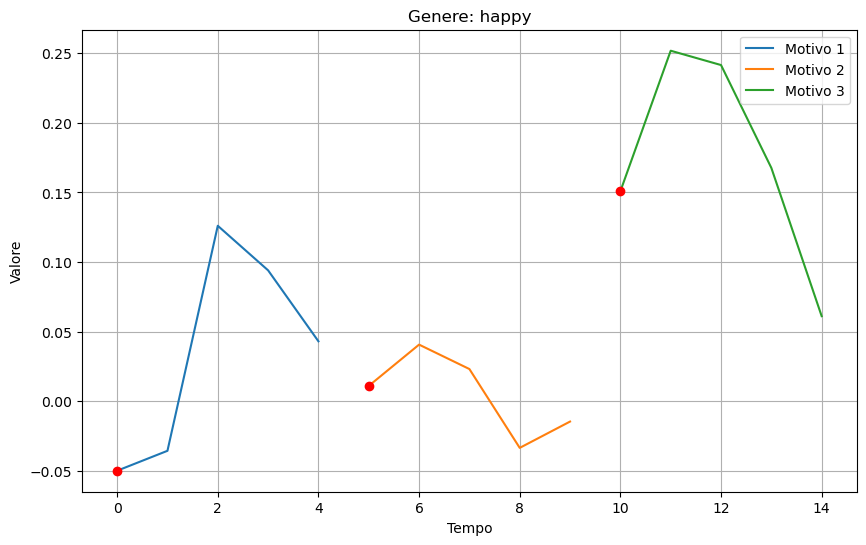

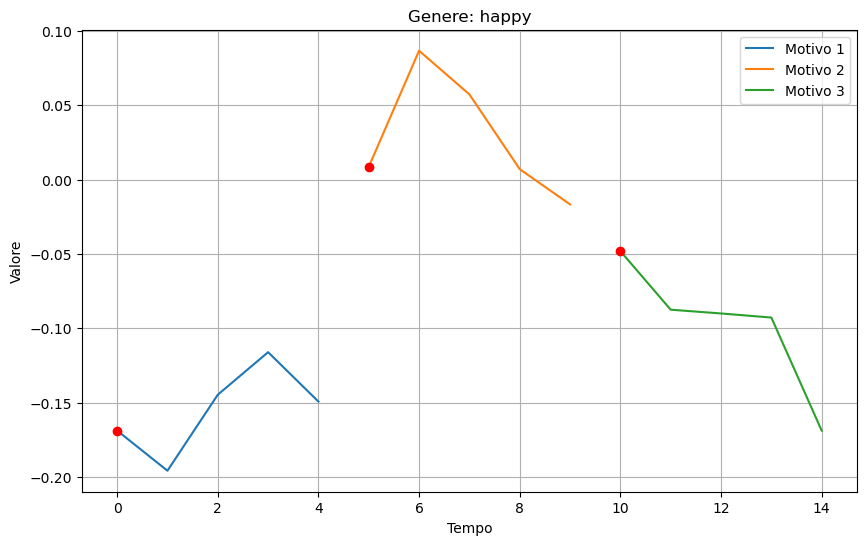

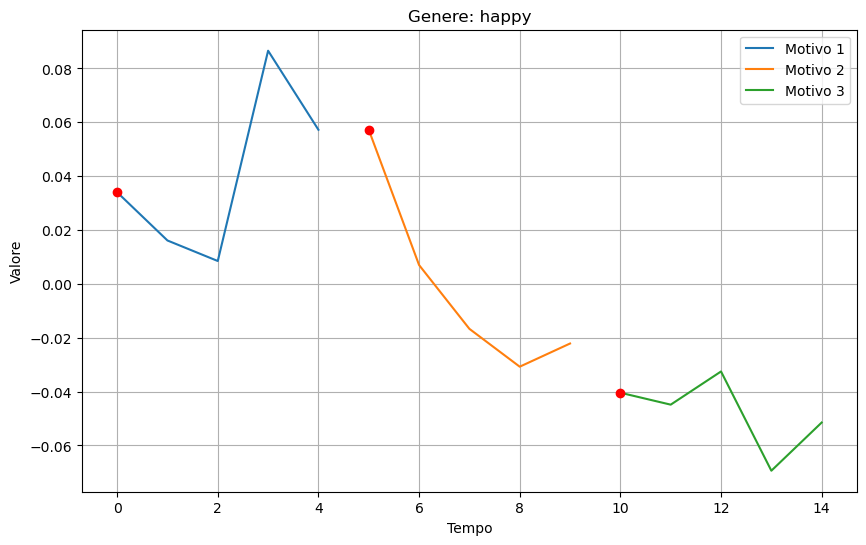

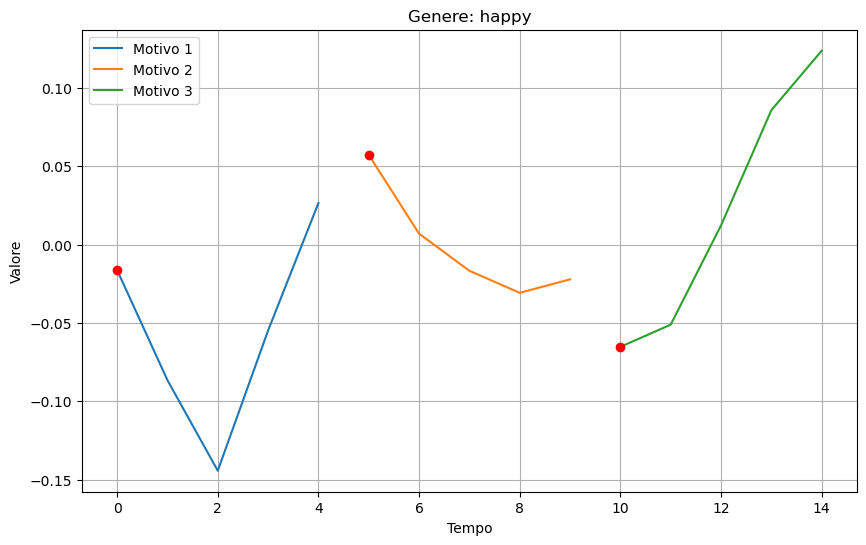

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 50

# Iteriamo su ogni genere
for genere in generi_unici:
    # Se il genere non è 'emo' o 'rock', passa al prossimo genere
    if genere not in ['happy']:
        continue
    
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_B_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_B = cluster_B_data['genre'].value_counts()

print(frequenza_generi_cluster_B)


mpb                  44
new-age              42
progressive-house    41
kids                 41
goth                 39
songwriter           39
minimal-techno       39
j-idol               39
emo                  38
honky-tonk           37
sleep                37
heavy-metal          36
piano                35
salsa                32
sertanejo            32
folk                 30
synth-pop            30
opera                30
world-music          26
happy                26
Name: genre, dtype: int64


In [ ]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_C_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_C = cluster_C_data['genre'].value_counts()

print(frequenza_generi_cluster_C)


heavy-metal          8
opera                7
emo                  5
j-idol               5
synth-pop            5
sleep                5
piano                5
goth                 5
sertanejo            4
world-music          4
minimal-techno       4
folk                 4
mpb                  4
honky-tonk           4
happy                3
salsa                3
songwriter           2
kids                 2
progressive-house    1
new-age              1
Name: genre, dtype: int64


# Classification - KNN dtw

In [15]:
import numpy as np
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import LabelEncoder
y = LabelEncoder().fit_transform(y_sampled)


# Reshape ts_paa_vect to remove the extra dimension
X = np.squeeze(ts_paa_vect)

# Now X should have a shape of (2000, 160)
print("X shape:", X.shape)

# Check the shape of y_sampled
print("y_sampled shape:", y_sampled.shape)

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15, stratify=y)

# Confirm the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X shape: (2000, 160)
y_sampled shape: (2000,)
X_train shape: (1600, 160)
X_test shape: (400, 160)
y_train shape: (1600,)
y_test shape: (400,)


In [ ]:
from fastdtw import fastdtw

Training with n_neighbors = 1...
Model trained with n_neighbors = 1.


Training with n_neighbors = 2...
Model trained with n_neighbors = 2.
Training with n_neighbors = 3...
Model trained with n_neighbors = 3.
Training with n_neighbors = 4...
Model trained with n_neighbors = 4.
Training with n_neighbors = 5...
Model trained with n_neighbors = 5.
Best n_neighbors: 5
Best score: 0.09375


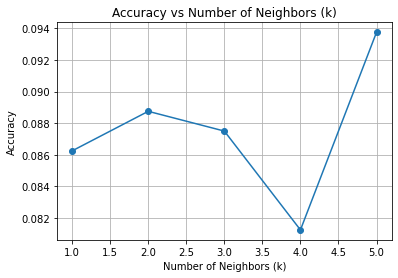

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier
from sklearn.metrics import accuracy_score

# Define the range of values for n_neighbors
n_neighbors_values = np.arange(1, 6)

# Initialize lists to store accuracy scores and best parameters
accuracy_scores = []
best_score = 0
best_n_neighbors = None

# Iterate over the values of n_neighbors
for n_neighbors in n_neighbors_values:
    print(f"Training with n_neighbors = {n_neighbors}...")
    
    # Create the KNN classifier with the current value of n_neighbors
    knn = KNeighborsTimeSeriesClassifier(n_neighbors=n_neighbors, distance="dtw") 
    
    # Fit the classifier to the data
    knn.fit(X_train, y_train)
    print(f"Model trained with n_neighbors = {n_neighbors}.")
    
    # Calculate the accuracy score on the test set
    score = knn.score(X_test, y_test)
    accuracy_scores.append(score)
    
    # Check if the current score is better than the best score
    if score > best_score:
        best_score = score
        best_n_neighbors = n_neighbors

# Print the best parameters and score
print("Best n_neighbors:", best_n_neighbors)
print("Best score:", best_score)

# Plot accuracy versus number of neighbors
plt.plot(n_neighbors_values, accuracy_scores, marker='o')
plt.title('Accuracy vs Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()


# Classification KNN euclidean

In [51]:
len(scaled)

4000

In [52]:
scaled.shape

(4000, 1280)

In [34]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


#from sklearn.preprocessing import LabelEncoder
y = LabelEncoder().fit_transform(y_sampled)

X = scaled

# Now X should have a shape of (2000, 160)
print("X shape:", X.shape)

# Check the shape of y_sampled
print("y_sampled shape:", y_sampled.shape)

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15, stratify=y)

# Confirm the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


NameError: name 'scaled' is not defined

Training with n_neighbors = 1...
Model trained with n_neighbors = 1.
Training with n_neighbors = 2...
Model trained with n_neighbors = 2.
Training with n_neighbors = 3...
Model trained with n_neighbors = 3.
Training with n_neighbors = 4...
Model trained with n_neighbors = 4.
Training with n_neighbors = 5...
Model trained with n_neighbors = 5.
Training with n_neighbors = 6...
Model trained with n_neighbors = 6.
Training with n_neighbors = 7...
Model trained with n_neighbors = 7.
Training with n_neighbors = 8...
Model trained with n_neighbors = 8.
Training with n_neighbors = 9...
Model trained with n_neighbors = 9.
Training with n_neighbors = 10...
Model trained with n_neighbors = 10.
Training with n_neighbors = 11...
Model trained with n_neighbors = 11.
Training with n_neighbors = 12...
Model trained with n_neighbors = 12.
Training with n_neighbors = 13...
Model trained with n_neighbors = 13.
Training with n_neighbors = 14...
Model trained with n_neighbors = 14.
Training with n_neighbor

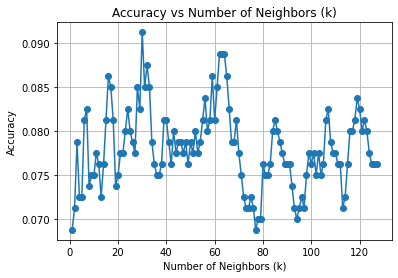

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier
from sklearn.metrics import accuracy_score

n_neighbors_values = np.arange(1, 128)

# Initialize lists to store accuracy scores and best parameters
accuracy_scores = []
best_score = 0
best_n_neighbors = None

# Iterate over the values of n_neighbors
for n_neighbors in n_neighbors_values:
    print(f"Training with n_neighbors = {n_neighbors}...")
    
    # Create the KNN classifier with the current value of n_neighbors
    knn = KNeighborsTimeSeriesClassifier(n_neighbors=n_neighbors, distance="euclidean") 
    
    # Fit the classifier to the data
    knn.fit(X_train, y_train)
    print(f"Model trained with n_neighbors = {n_neighbors}.")
    
    # Calculate the accuracy score on the test set
    score = knn.score(X_test, y_test)
    accuracy_scores.append(score)
    
    # Check if the current score is better than the best score
    if score > best_score:
        best_score = score
        best_n_neighbors = n_neighbors

# Print the best parameters and score
print("Best n_neighbors:", best_n_neighbors)
print("Best score:", best_score)

# Plot accuracy versus number of neighbors

plt.plot(n_neighbors_values, accuracy_scores, marker='o')
plt.title('Accuracy vs Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Shapelet classification

In [59]:
from sktime.classification.shapelet_based import ShapeletTransformClassifier
from sklearn.metrics import classification_report


In [60]:
st = ShapeletTransformClassifier()

In [61]:
%%time                         #4000 development set # NON MODIFICARE
st.fit(X_train, y_train)
y_pred = st.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.08      0.10      0.09        40
           1       0.10      0.05      0.07        40
           2       0.12      0.05      0.07        40
           3       0.25      0.47      0.33        40
           4       0.11      0.05      0.07        40
           5       0.20      0.12      0.15        40
           6       0.11      0.12      0.11        40
           7       0.13      0.17      0.15        40
           8       0.49      0.55      0.52        40
           9       0.07      0.07      0.07        40
          10       0.25      0.42      0.31        40
          11       0.20      0.20      0.20        40
          12       0.26      0.28      0.27        40
          13       0.27      0.25      0.26        40
          14       0.07      0.07      0.07        40
          15       0.10      0.12      0.11        40
          16       0.32      0.17      0.23        40
          17       0.17    

# Random shapelet transform 

In [20]:
from sklearn.tree import DecisionTreeClassifier
from sktime.transformations.panel.shapelet_transform import RandomShapeletTransform
from sktime.transformations.compose import FitInTransform
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [22]:
rst = RandomShapeletTransform(n_shapelet_samples=10000, max_shapelets=None, min_shapelet_length=3, max_shapelet_length=None, n_jobs=-1) #n_jobs -1 uses all processors

In [25]:
%%time
rst.fit(X_train, y_train)

ZeroDivisionError: division by zero

# TSLearn shapelets

In [13]:
from tensorflow.keras.optimizers import Adam
from tslearn.shapelets import LearningShapelets, grabocka_params_to_shapelet_size_dict

In [14]:
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.shapelets import ShapeletModel
from sklearn.tree import DecisionTreeClassifier

In [16]:
shapelet_sizes = {20: 150}   # len shapelets: numbers of shapelets 20:150 0.11 acc

# Define the model and fit it using the training data
shp_clf = LearningShapelets(n_shapelets_per_size=shapelet_sizes,
                            weight_regularizer=0.001,
                            optimizer=Adam(lr=0.01),
                            max_iter=250,
                            verbose=0,
                            scale=False,
                            random_state=42)
shp_clf.fit(X_train, y_train)   

c:\Users\corra\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning: The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.
  warnings.warn("The default value for 'scale' is set to False "


LearningShapelets(max_iter=250, n_shapelets_per_size={20: 150},
                  optimizer=<keras.src.optimizers.adam.Adam object at 0x0000025D613C4730>,
                  random_state=42, weight_regularizer=0.001)

In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Step 2: Retrieve learned shapelets
shapelets = shp_clf.shapelets_

# Step 3: Transform the training and test data using the learned shapelets
X_train_transformed = shp_clf.transform(X_train)
X_test_transformed = shp_clf.transform(X_test)

# Step 4: Train a decision tree classifier using the transformed data
tree_clf = DecisionTreeClassifier()

# Define Hyperparameters Grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10, 20],
    'min_samples_split': [10, 15, 20],
    'min_samples_leaf': [2, 4, 6]
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=tree_clf, param_grid=param_grid, cv=5, verbose=1)

# Fit Grid Search
grid_search.fit(X_train_transformed, y_train)

# Get Best Parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Get Best Estimator
best_estimator = grid_search.best_estimator_

best_estimator.fit(X_train_transformed, y_train)
accuracy = best_estimator.score(X_test_transformed, y_test)
print("Accuracy:", accuracy)

# Step 5: Make predictions on the test data using the decision tree classifier
y_pred = best_estimator.predict(X_test_transformed)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 20}
Accuracy: 0.12


In [19]:
from sklearn.metrics import classification_report

# Step 6: Generate a classification report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.24      0.25      0.24        20
           1       0.08      0.05      0.06        20
           2       0.00      0.00      0.00        20
           3       0.09      0.10      0.09        20
           4       0.40      0.10      0.16        20
           5       0.10      0.10      0.10        20
           6       0.04      0.05      0.04        20
           7       0.11      0.25      0.15        20
           8       0.32      0.40      0.36        20
           9       0.09      0.05      0.06        20
          10       0.17      0.15      0.16        20
          11       0.00      0.00      0.00        20
          12       0.20      0.10      0.13        20
          13       0.21      0.15      0.18        20
          14       0.06      0.10      0.07        20
          15       0.00      0.00      0.00        20
          16       0.38      0.30      0.33        20
          17       0.00    

In [89]:
# Assuming y_sampled is your encoded target labels
y_encoded = LabelEncoder().fit_transform(y_sampled)

# Reverse label encoding for the value "8"
label_encoder = LabelEncoder()
label_encoder.fit(y_sampled)
decoded_label = label_encoder.inverse_transform([8])[0]
decoded_label_2 = label_encoder.inverse_transform([4])[0]
decoded_label_3 = label_encoder.inverse_transform([16])[0]


print("Decoded label for value '8':", decoded_label)
print("Decoded label for value '4':", decoded_label_2)

Decoded label for value '8': minimal-techno
Decoded label for value '4': heavy-metal


## 8: Minimal techno

In [20]:
# Extract time series belonging to class 8
class_8_indices = np.where(y_train == 8)[0]
x_train_class_8 = X_train[class_8_indices]

print("Shape of time series belonging to class 8:", x_train_class_8.shape)


Shape of time series belonging to class 8: (80, 160)


In [22]:
# Create a DataFrame with time series and labels
df = pd.DataFrame(x_train_class_8)

# Add a column for labels
df['label'] = 8  # Since we filtered out class 8, all labels will be 8

df.head()

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,label
0,1.346668,0.256442,-0.318801,-0.010463,-0.043236,-0.042284,-0.024596,-0.195162,-0.092939,-0.076220,...,0.465337,0.458860,0.438111,0.418622,0.416626,0.401877,0.389390,0.375564,0.367932,8
1,-1.373916,-1.424228,-0.904041,-0.805457,-0.791634,-0.839407,-0.673138,-0.535385,-0.487409,-0.289333,...,-0.017738,-0.020365,-0.009459,-0.002511,-0.005303,-0.002817,0.031076,0.039326,0.065054,8
2,0.504387,0.015058,0.188868,0.093976,0.054545,0.012403,0.173440,0.132284,0.092271,0.038390,...,-0.299818,-0.300199,-0.248212,-0.223383,-0.217135,-0.183620,-0.232359,-0.246961,-0.308267,8
3,-0.585997,-0.430995,-0.531500,-0.444408,-0.481546,-0.569178,-0.543598,-0.571284,-0.536654,-0.508338,...,0.336663,0.282430,0.311495,0.288274,0.273163,0.305676,0.261005,0.325263,0.351071,8
4,0.462112,-0.416541,-0.561599,-0.696358,-0.715927,-0.474395,-0.424913,-0.173051,-0.111291,-0.183041,...,0.038866,-0.016186,-0.110259,-0.236233,-0.350448,-0.399736,-0.422857,-0.439792,-0.458755,8


In [27]:
# Calculate the mean of each vector in x_train_class_8
mean_vectors = np.mean(x_train_class_8, axis=1)

print(np.mean(mean_vectors))

0.0056341251736961254


In [87]:
import numpy as np

# QUESTO CODICE HA QUALCOSA CHE NON VA

# Step 1: Calculate distances between single value mean and shapelets
distances = np.abs(shapelets - np.mean(mean_vectors))

# Step 2: Flatten the distances array
flattened_distances = distances.flatten()

# Step 3: Find the shapelet with minimum distance
min_distance_index = np.argmin(flattened_distances.all)

# Step 4: Label the shapelet with class 8
shapelet_class_8 = shapelets[min_distance_index]
label = 8  # Class label for class 8

print("Shapelet with minimum distance:", shapelet_class_8)
print("Label:", label)


Shapelet with minimum distance: [[-0.48546717]
 [-0.78681558]
 [-0.90867555]
 [-0.92236853]
 [-0.96481019]
 [-0.89861369]
 [-0.8560394 ]
 [-0.80247754]
 [-0.69367492]
 [-0.55907726]
 [-0.36890364]
 [-0.1904617 ]
 [ 0.05126095]
 [ 0.25330985]
 [ 0.42462289]
 [ 0.64333034]
 [ 0.74701273]
 [ 0.82627088]
 [ 0.89905262]
 [ 0.92314804]]
Label: 8


In [88]:
shapelet_class_8

array([[-0.48546717],
       [-0.78681558],
       [-0.90867555],
       [-0.92236853],
       [-0.96481019],
       [-0.89861369],
       [-0.8560394 ],
       [-0.80247754],
       [-0.69367492],
       [-0.55907726],
       [-0.36890364],
       [-0.1904617 ],
       [ 0.05126095],
       [ 0.25330985],
       [ 0.42462289],
       [ 0.64333034],
       [ 0.74701273],
       [ 0.82627088],
       [ 0.89905262],
       [ 0.92314804]])

In [62]:
concatenated_array = np.vstack(shapelet_class_8).reshape(1,-1)

In [80]:
shapeletclasse8 = concatenated_array.squeeze()

In [82]:
shapeletclasse8

array([-0.48546717, -0.78681558, -0.90867555, -0.92236853, -0.96481019,
       -0.89861369, -0.8560394 , -0.80247754, -0.69367492, -0.55907726,
       -0.36890364, -0.1904617 ,  0.05126095,  0.25330985,  0.42462289,
        0.64333034,  0.74701273,  0.82627088,  0.89905262,  0.92314804])

In [86]:
shapelets

array([array([[-0.48546717],
              [-0.78681558],
              [-0.90867555],
              [-0.92236853],
              [-0.96481019],
              [-0.89861369],
              [-0.8560394 ],
              [-0.80247754],
              [-0.69367492],
              [-0.55907726],
              [-0.36890364],
              [-0.1904617 ],
              [ 0.05126095],
              [ 0.25330985],
              [ 0.42462289],
              [ 0.64333034],
              [ 0.74701273],
              [ 0.82627088],
              [ 0.89905262],
              [ 0.92314804]]), array([[ 0.9455018 ],
                                      [ 0.95930785],
                                      [-0.07999281],
                                      [-0.36257538],
                                      [ 0.96885008],
                                      [ 0.97703469],
                                      [ 0.81781566],
                                      [-0.51848334],
                         

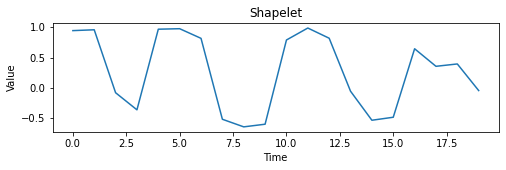

In [92]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 2))
plt.plot(shapelets[0])
plt.title('Shapelet')
plt.xlabel('Time')
plt.ylabel('Value')
plt.show()


## 4:Heavy metal

In [81]:
# Choose the class label you want to filter shapelets for
target_class = 4  # Change this to the class label you're interested in

# Find indices of instances with the target class label
indices_target_class = np.where(y_train == target_class)[0]

# Filter indices to ensure they are within bounds of the shapelets array
indices_target_class = indices_target_class[indices_target_class < len(shapelets)]

# Get shapelets for instances of the target class
shapelets_target_class = [shapelets[i] for i in indices_target_class]

# Now shapelets_target_class contains the shapelets corresponding to instances labeled with the target class


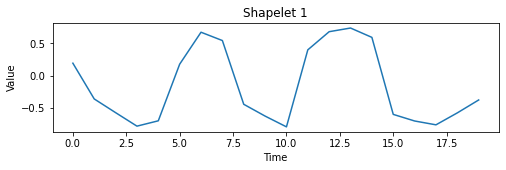

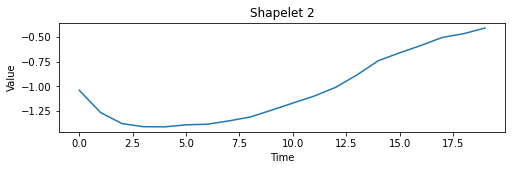

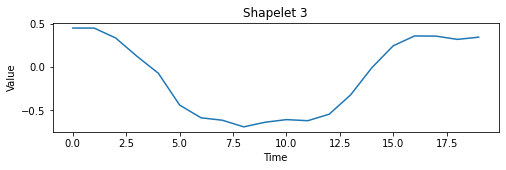

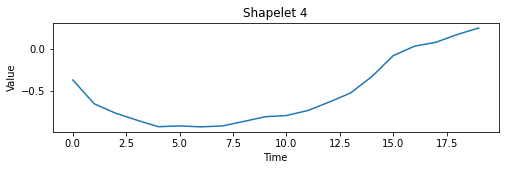

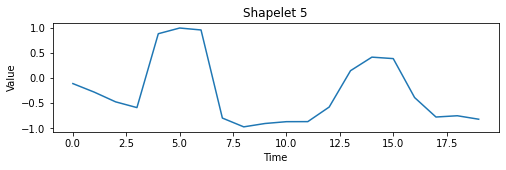

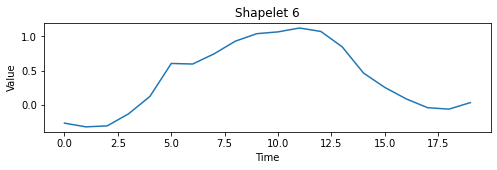

In [84]:
import matplotlib.pyplot as plt

# Visualize the first 7 shapelets
for i in range(6):
    plt.figure(figsize=(8, 2))
    plt.plot(shapelets_target_class[i])
    plt.title(f'Shapelet {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.show()


# Features based classification

In [87]:
from sktime.pipeline import make_pipeline
from sktime.transformations.series.summarize import SummaryTransformer
from sklearn.linear_model import LogisticRegressionCV
from sktime.pipeline import sklearn_to_sktime

In [88]:
pipe = make_pipeline(SummaryTransformer(), sklearn_to_sktime(LogisticRegressionCV()))

In [89]:
%%time
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(classification_report(y_test, y_pred))

c:\Users\corra\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\corra\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

              precision    recall  f1-score   support

           0       0.10      0.08      0.09       100
           1       0.00      0.00      0.00       100
           2       0.00      0.00      0.00       100
           3       0.19      0.24      0.21       100
           4       0.10      0.07      0.08       100
           5       0.04      0.05      0.04       100
           6       0.11      0.04      0.06       100
           7       0.09      0.24      0.13       100
           8       0.10      0.13      0.12       100
           9       0.14      0.03      0.05       100
          10       0.20      0.45      0.28       100
          11       0.00      0.00      0.00       100
          12       0.03      0.02      0.03       100
          13       0.15      0.19      0.17       100
          14       0.11      0.37      0.17       100
          15       0.06      0.08      0.07       100
          16       0.08      0.08      0.08       100
          17       0.00    